Рынок заведений общественного питания Москвы
======

**Описание:**
Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве.

Подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.


**Цель исследования**
- Подготовить презентацию по исследованию рынка общепита

**Входные данный** 
- `moscow_places.csv` - датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года

**Описание данных** 
- `name` — название заведения;
- `address` — адрес заведения;
- `category` — категория заведения;
- `hours` — информация о днях и часах работы;
- `lat` — широта географической точки;
- `lng` — долгота географической точки;
- `rating` — рейтинг заведения по оценкам пользователей;
- `price` — категория цен в заведении;
- `avg_bill` — строка хранит среднюю стоимость заказа;
- `middle_avg_bill` — число с оценкой среднего чека;
- `middle_coffee_cup` — число с оценкой одной чашки капучино;
- `chain` — является ли заведение сетевым (0, 1);
- `district` — административный район;
- `seats` — количество посадочных мест.

**Ход исследования**
1. **Обзор данных.** 
2. **Предобработка данных**
3. **Анализ данных**
4. **Детализируем исследование: открытие кофейни**
5. **Подготовка презентации**
6. **Выводы**

## Обзор данных.
Загружаем данные и подготовим их к анализу.

**Путь к файлу**

`/datasets/moscow_places.csv`

### Импорт библиотек и загрузка данных
`pandas` - библиотека для загрузки и обработки данных

`matplotlib.pyplot` - библиотека для работы с графиками

`datetime` - библиотека для работой с датой

`seaborn` - библиотека для создания статистических графиков

`numpy` - библиотека высокоуровневых математических функций

`scipy.stats` - библиотека для работы со статистический анализом данных

`re` - модуль для регулярных выражений

`os` - библиотека функций для работы с операционной системой

`plotly` - библиотека визуализации данных (для воронкообразных диаграмм)

`json` - модуль для работы с JSON-форматом

`folium` - модуль для работы c картой

In [1]:
import pandas as pd
import numpy as np
import datetime as dt
import seaborn as sns
import scipy.stats as stats
import matplotlib.pyplot as plt
import re
import os
from plotly import graph_objects as go
import plotly.express as px
from folium import Map, Choropleth, Marker, DivIcon
from folium.plugins import MarkerCluster
from folium.features import CustomIcon
import json

Функция общей иформации и первичные проверки:

In [2]:
def pre_check(df):
    display(df.head(5)) # вывод первых 5 строк
    display('Количество пустых ячеек:', df.isna().sum()) # количество пустых ячеек
    display('Количество дубликатов:', df.duplicated().sum()) # количество абсолютных дубликатов
    df.info() # общая информация

### Загрузим файл из папки /datasets и сохраним в переменную

Загрузим файлы для проекта:

In [3]:
#датасет с заведениями общественного питания Москвы
pth1 = '/datasets/moscow_places.csv'
pth2 = 'moscow_places.csv'
#границы районов Москвы
pth_json_1 = '/datasets/admin_level_geomap.geojson'
pth_json_2 = 'admin_level_geomap.geojson'


if os.path.exists(pth1):
    places = pd.read_csv(pth1)
    display('Загрузка онлайн')
elif os.path.exists(pth2):
    places = pd.read_csv(pth2)
    display('Загрузка офлайн')
else:
    print('Something is wrong')
    
if os.path.exists(pth_json_1):
    path_json = pth_json_1
    display('Загрузка json онлайн')
elif os.path.exists(pth_json_2):
    path_json = pth_json_2
    display('Загрузка json офлайн')
else:
    print('Something is wrong json')   
    
pre_check(places)

'Загрузка офлайн'

'Загрузка json офлайн'

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


'Количество пустых ячеек:'

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

'Количество дубликатов:'

0

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Как видим всего в базе **8406 заведений.**

**Стилистических нарушений** в заголовках **нет.**

**Абсолютных дубликатов нет.**

На первый взгляд значения колонок **соответствует предоставленному описанию.**

Пустые значения в колонках посмотрим относительные значения:

In [4]:
places.shape[0]

8406

In [5]:
round(places.isna().sum() / places.shape[0] * 100)

name                  0.0
category              0.0
address               0.0
district              0.0
hours                 6.0
lat                   0.0
lng                   0.0
rating                0.0
price                61.0
avg_bill             55.0
middle_avg_bill      63.0
middle_coffee_cup    94.0
chain                 0.0
seats                43.0
dtype: float64

Часть колонок **имеют пустые значения:**
- `hours` - **6%** заведений в базе отсутствует днанные *по дням и часам работы*
- `price` - **61%** заведений в базе отсутствует днанные *по категорию цен*
- `avg_bill` - **55%** заведений в базе отсутствует днанные *по среднему чеку* 
- `middle_avg_bill` - **63%** заведений в базе отсутствует днанные *по числу среднего чека*
- `middle_coffee_cup` - **94%** заведений в базе отсутствует днанные *по числу стоимости чашки кофе*
- `seats` - **43%** заведений в базе отсутствует днанные *по числу ппосадочных мест*

Часть пустых значений можно объясняеть тем что если заведение не кофейня то у нее будет отсутствовать `middle_coffee_cup`(стоимость чашки кофе) и наоборот если это кофейня то у нее нет `middle_avg_bill`(стоимость среднего чека).

Нужно проверить это утверждение.

Так же можно попробовать восстановить данные по *по категорию цен* взяв за основу средний чек там на 6% меньше пропусков.

Также можно проверить есть ли пустоты по **сетевым заведениям** чаще всего у них должны совпадать часть данных: по *времени работы* и *среднему чеку*

## Предобработка данных

Посмотрим какик данные делятся по `avg_bill`

напишем функцию для создания колонки только с текстом без цен:

In [6]:
def avg_bill_text(df):
    df = df.copy()
    cat = []
    df['avg_bill'] = df['avg_bill'].fillna ('')
    for cell in df['avg_bill']:
        cat.append(cell.split(':', 1)[0])
    return cat

напишем функцию для добовление колонки относительных данных

In [7]:
def ratio(df, row, func):
    
    if func == 'sum':
        total = df[row].sum()
    if func == 'count':
        total = df.shape[0]
        
    df['ratio'] = round(df[row]/total,2)
    return df

добавим колонку без цен по среднему чеку

In [8]:
places['avg_bill_text'] = avg_bill_text(places)
places.head(5)


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,avg_bill_text
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,Средний счёт
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Средний счёт
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,Цена чашки капучино
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Средний счёт


In [9]:
avg_bill = places.groupby('avg_bill_text').agg({'name':'count'}).sort_values(by='name', ascending=False)
ratio(avg_bill, 'name', 'sum')

,name,ratio
avg_bill_text,,
,4590,0.55
Средний счёт,3149,0.37
Цена чашки капучино,535,0.06
Цена бокала пива,132,0.02


По колонке `avg_bill`  у нас для среднего чека есть три деления(не считая пропусков 4590 - 55%) это:

- Средний счёт - 3149 - 37%
- Цена чашки капучино - 535 - 6%
- Цена бокала пива - 132 - 2%

Проверим пересечение этих групп с категориями заведений:

In [10]:
gr_avg_bill = (places[~places['avg_bill'].isna()].groupby(['avg_bill_text','category'])
    .agg({'name':'count'})
    .reset_index()
    .pivot_table(index='avg_bill_text', columns='category', values='name', aggfunc='sum'))

gr_avg_bill = gr_avg_bill.fillna(0)
gr_avg_bill

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
avg_bill_text,,,,,,,,
Средний счёт,349.0,53.0,237.0,694.0,200.0,395.0,1040.0,181.0
Цена бокала пива,130.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0
Цена чашки капучино,6.0,0.0,1.0,4.0,521.0,3.0,0.0,0.0


Посмотрим на график:

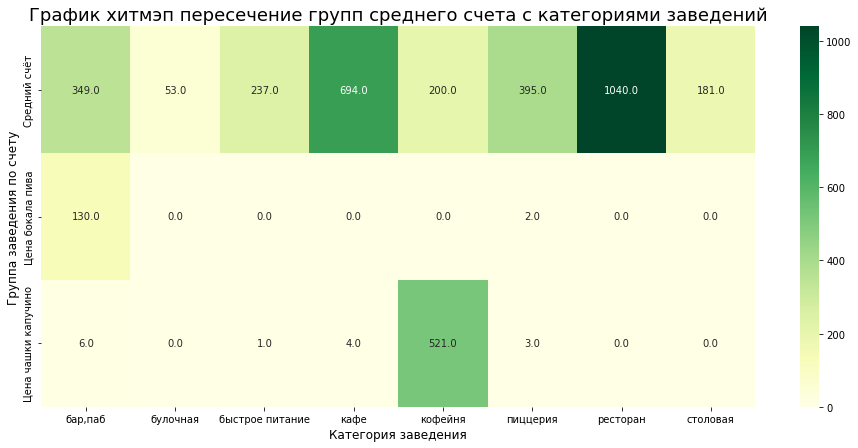

In [11]:
fig = plt.subplots(figsize =(16, 7))
sns.heatmap(gr_avg_bill, annot=True, cmap='YlGn', fmt='')
plt.title('График хитмэп пересечение групп среднего счета с категориями заведений', size=18)
plt.ylabel('Группа заведения по счету', size=12)
plt.xlabel('Категория заведения', size=12);

В основном все заведения в базе ориентируется на "средний счет" во всех категориях, только у кофеен лидирует "цена за капучино"(521). "цена за капучино" так же встречается в барах(6), кафе(4), пиццерии(3) и бистро(1)

Цена бокала пиво естественный лиде бары(130) и две пиццерии.

Посмотрим сколько 

In [12]:
category_gr = places['category'].value_counts().reset_index()
ratio(category_gr, 'category', 'sum')
category_gr

,index,category,ratio
0,кафе,2378,0.28
1,ресторан,2043,0.24
2,кофейня,1413,0.17
3,"бар,паб",765,0.09
4,пиццерия,633,0.08
5,быстрое питание,603,0.07
6,столовая,315,0.04
7,булочная,256,0.03


Посмотрим на кофейни их пропуски.

In [13]:
print('Всего кофеен:' ,places[places['category'] == 'кофейня'].shape[0])
print()
print('Пропуски в категории кофейня:')
round(places[places['category'] == 'кофейня'].isna().sum() / places[places['category'] == 'кофейня'].shape[0] * 100)

Всего кофеен: 1413

Пропуски в категории кофейня:


name                  0.0
category              0.0
address               0.0
district              0.0
hours                 1.0
lat                   0.0
lng                   0.0
rating                0.0
price                66.0
avg_bill             49.0
middle_avg_bill      86.0
middle_coffee_cup    63.0
chain                 0.0
seats                47.0
avg_bill_text         0.0
dtype: float64

In [14]:
print('Всего не кофеен:' ,places[places['category'] != 'кофейня'].shape[0])
print()
print('Пропуски в категории не кофейня:')
round(places[places['category'] != 'кофейня'].isna().sum() / places[places['category'] != 'кофейня'].shape[0] * 100)

Всего не кофеен: 6993

Пропуски в категории не кофейня:


name                   0.0
category               0.0
address                0.0
district               0.0
hours                  7.0
lat                    0.0
lng                    0.0
rating                 0.0
price                 59.0
avg_bill              56.0
middle_avg_bill       58.0
middle_coffee_cup    100.0
chain                  0.0
seats                 42.0
avg_bill_text          0.0
dtype: float64

- В категории не кофейни как мы и предпологали **100% пропусков** в *стоимости чашки кофе*
- А вот в кофейнях **86%** в *стоимости среднего чека* и **63%** в *стоимости чашки кофе* получается в части кофеен есть данные по *средней чашечке капучино* а в некоторых *средний чек*.

попробуем заполнить пропуски в категории `price` на основе средних чеков:

In [15]:
category_price = places.groupby('price').agg({'middle_avg_bill':'max','middle_coffee_cup':'max'}).sort_values('middle_avg_bill').reset_index()
category_price

,price,middle_avg_bill,middle_coffee_cup
0,низкие,600.0,256.0
1,средние,2150.0,1568.0
2,выше среднего,4500.0,256.0
3,высокие,35000.0,250.0


Видим что оринтироваться на стоимоть каппучно не имеет смысла так как 3 категории 250-256 р. средняя цена 1568р.

А вот по среднему чеку можно сделать функцию и добавить там где мы може ориентироваться на средний чек:

In [16]:
def price_group(row):
    
    price = row['middle_avg_bill']
    
    try:
        if price <= category_price.middle_avg_bill[0]:
            return category_price.price[0]
        if price <= category_price.middle_avg_bill[1]:
            return category_price.price[1]
        if price <= category_price.middle_avg_bill[2]:
            return category_price.price[2]
        return category_price.price[3]
    except:
        display('Ошибка проверить тип данных в price')

#для проверки сделаем серию pandas и запустим нашу функцию
row_values = [201]
row_columns = ['middle_avg_bill']

row = pd.Series(data=row_values, index=row_columns)

price_group(row)

'низкие'

In [17]:
def avg_bill_text(df):
    df = df.copy()
    cat = []
    df['avg_bill'] = df['avg_bill'].fillna ('')
    for cell in df['avg_bill']:
        cat.append(cell.split(':', 1)[0])
    return cat
        
places['avg_bill_text'] = avg_bill_text(places)
places['avg_bill_text'].value_counts()

                       4590
Средний счёт           3149
Цена чашки капучино     535
Цена бокала пива        132
Name: avg_bill_text, dtype: int64

In [18]:
price_na = places[(places['avg_bill_text'] == 'Средний счёт') & (places['price'].isna())][['price', 'middle_avg_bill']]
price_na

,price,middle_avg_bill
27,NaN,240.0
32,NaN,328.0
34,NaN,500.0
49,NaN,900.0
84,NaN,300.0
...,...,...
8347,NaN,350.0
8366,NaN,500.0
8383,NaN,150.0
8399,NaN,150.0


In [19]:
price_na['price'] = price_na.apply(price_group, axis=1)
price_na.head(5)

,price,middle_avg_bill
27,низкие,240.0
32,низкие,328.0
34,низкие,500.0
49,средние,900.0
84,низкие,300.0


In [20]:
places.loc[(places['avg_bill_text'] == 'Средний счёт') & (places['price'].isna()), 'price'] = price_na['price']

In [21]:
middle_beer = places[places['avg_bill_text'] == 'Цена бокала пива']['avg_bill'].apply(
    lambda x: np.mean(list(map(int, re.findall('\d+', x))))
)

places.insert(len(places.columns), 'middle_beer', middle_beer)
places[~places['middle_beer'].isna()].head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,avg_bill_text,middle_beer
10,Great Room Bar,"бар,паб","Москва, Левобережная улица, 12",Северный административный округ,"ежедневно, круглосуточно",55.877832,37.469171,4.5,средние,Цена бокала пива:250–350 ₽,NaN,NaN,0,102.0,Цена бокала пива,300.0
67,Штаб квартира,"бар,паб","Москва, Дубнинская улица, 32",Северный административный округ,"пн-чт 12:30–00:00; пт,сб 12:30–02:00; вс 12:30...",55.883112,37.558867,5.0,средние,Цена бокала пива:120–350 ₽,NaN,NaN,0,16.0,Цена бокала пива,235.0
97,Жигулевское,"бар,паб","Москва, Бибиревская улица, 7к2",Северо-Восточный административный округ,"пн-чт 14:00–00:00; пт,сб 14:00–02:00; вс 14:00...",55.879733,37.593734,4.5,средние,Цена бокала пива:90–230 ₽,NaN,NaN,0,NaN,Цена бокала пива,160.0
241,Алиби,"бар,паб","Москва, улица Малыгина, 1, стр. 2",Северо-Восточный административный округ,пн-чт 11:00–00:00; пт-вс 11:00–05:00,55.876348,37.701604,4.4,выше среднего,Цена бокала пива:160–499 ₽,NaN,NaN,0,40.0,Цена бокала пива,329.5
417,Сибирская Корона,"бар,паб","Москва, Планерная улица, 12к1",Северо-Западный административный округ,"ежедневно, 12:00–00:00",55.861691,37.436686,4.3,средние,Цена бокала пива:199–300 ₽,NaN,NaN,0,NaN,Цена бокала пива,249.5


Помотрим на количество уникальных заведений:

In [22]:
print('Абсолютное значение:', len(places['name'].unique()))
print()
print('Относительное значение:', round(len(places['name'].unique()) / places.shape[0] ,3))

Абсолютное значение: 5614

Относительное значение: 0.668


- Уникальных имен заведений **5614(67%)**

Посмотрим на процент пропусков данных:

In [23]:
round(places.isna().sum() / places.shape[0] * 100,2)

name                  0.00
category              0.00
address               0.00
district              0.00
hours                 6.38
lat                   0.00
lng                   0.00
rating                0.00
price                54.97
avg_bill             54.60
middle_avg_bill      62.54
middle_coffee_cup    93.64
chain                 0.00
seats                42.96
avg_bill_text         0.00
middle_beer          98.43
dtype: float64

Остальные пропуски оставим как есть чтобы не искажать данные.

Хорошо, посмотрим на дубликаты, проверив по нескольким колонкам

По имени и адресу:

In [24]:
places.duplicated(['name','address']).sum()

0

По имени и координатам:

In [25]:
places.duplicated(['name','lat','lng']).sum()

0

Посмотрим на процент пропусков данных:

In [26]:
round(places.isna().sum() / places.shape[0] * 100,2)

name                  0.00
category              0.00
address               0.00
district              0.00
hours                 6.38
lat                   0.00
lng                   0.00
rating                0.00
price                54.97
avg_bill             54.60
middle_avg_bill      62.54
middle_coffee_cup    93.64
chain                 0.00
seats                42.96
avg_bill_text         0.00
middle_beer          98.43
dtype: float64

Проверим везде ли у нас Москва:

In [27]:
places['address'].str.extract(r'(.*?)(?=\,)').value_counts()

Москва    8406
dtype: int64

Отлично везде Москва.

Создадим колонку с значением только улицы заведения:

In [28]:
places['street'] = places['address'].str.extract(r'(?<=\,\s)(.*?)(?=\,\s)')
places.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,avg_bill_text,middle_beer,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,,NaN,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,Средний счёт,NaN,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Средний счёт,NaN,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,Цена чашки капучино,NaN,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Средний счёт,NaN,Правобережная улица


Посмотрим сколько значений могло оказаться пустыми:

In [29]:
print('Кол-во "пустых" улиц:',len(places[places['street'].isna()]))
places[places['street'].isna()]['address'].head(10)

Кол-во "пустых" улиц: 95


25                          Москва, парк Левобережный
60          Москва, ландшафтный заказник Лианозовский
64        Москва, Лианозовский парк культуры и отдыха
73                             Москва, парк Алтуфьево
137                      Москва, парк Ангарские пруды
157               Москва, Проектируемый проезд № 5265
189                      Москва, парк Ангарские Пруды
215                      Москва, парк Ангарские пруды
267     Москва, парк Этнографическая деревня Бибирево
345    Москва, парк культуры и отдыха Северное Тушино
Name: address, dtype: object

Добавим их другой обработкой:

In [30]:
#выбараем значение из строки от первой запятой и пробела до конца строки
places['street'] = places['street'].fillna(
    places[places['street'].isna()][ 'address'].str.extract(r'(?<=\,\s)(.*?)(?=$)')[0]
)

print('Кол-во "пустых" улиц:',len(places[places['street'].isna()]))

Кол-во "пустых" улиц: 0


Хорошо теперь посмотрим на дубликаты в улицах:

In [31]:
#список слов для удаления из строки
words_del = ['улица','переулок','шоссе','проспект','площадь','проезд',
         'село','аллея','бульвар','набережная','тупик','линия','город','поселение']

#собираем уникальный улиц
streets = pd.Series(places['street'].unique(), copy=False).sort_values()

#удаляем слова (с пробелом слева и справа)
for word in words_del:
    streets = streets.str.replace(word+' ', '')
    streets = streets.str.replace(' '+word, '')
    
street_name = list(streets)

#собираем повторяющиеся названия
street_name_unique = [item for item in set(street_name) if street_name.count(item) > 1]

#собираем уникальный улиц
all_list_street = list(pd.Series(places['street'].unique(), copy=False).sort_values())
#убираем пропуски
cleaned_list_street = [x for x in all_list_street if str(x) != 'nan']

#собираем все улицы со списка повторяющихся названий
street_duplicated = (
    [cleaned_list_street[i] for i in range(len(cleaned_list_street)) for w in street_name_unique if w in cleaned_list_street[i]]
)
    
street_duplicated

['2-я улица Энтузиастов',
 'Беговая аллея',
 'Беговая улица',
 'Гончарная набережная',
 'Гончарная улица',
 'Дербеневская набережная',
 'Дербеневская улица',
 'Измайловский бульвар',
 'Измайловский парк культуры и отдыха',
 'Измайловский проезд',
 'Измайловский проспект',
 'Коломенская набережная',
 'Коломенская улица',
 'Кутузовский проезд',
 'Кутузовский проспект',
 'Нагатинская набережная',
 'Нагатинская улица',
 'Нагорный бульвар',
 'Нагорный проезд',
 'Никитский бульвар',
 'Никитский переулок',
 'Новая Басманная улица',
 'Новая Переведеновская улица',
 'Новая площадь',
 'Новая улица',
 'Новоясеневский проспект',
 'Новоясеневский тупик',
 'Павелецкая набережная',
 'Павелецкая площадь',
 'Преображенская площадь',
 'Преображенская улица',
 'Пушкинская набережная',
 'Пушкинская площадь',
 'Садовническая набережная',
 'Садовническая улица',
 'Смоленская площадь',
 'Смоленская улица',
 'Смоленская-Сенная площадь',
 'Спартаковская площадь',
 'Спартаковская улица',
 'Суворовская площадь',

Посмотре все повторяющие улицы делаем словарь с исправленными названиями:

In [32]:
replace_name_street = {
    'Ангарская':'Ангарская улица',
    'Базовская':'Базовская улица',
    'Дыбенко':'улица Дыбенко',
    'Дмитровское':'Дмитровское шоссе',
    'Ижорская':'Ижорская улица',
    'Ижорский':'Ижорский проезд',
    'Клязьминская':'Клязьминская улица',
    'Коровинское':'Коровинское шоссе',
    'Левобережная':'Левобережная улица',
    'Ленинградское':'Ленинградское шоссе',
    'Маршала Федоренко':'улица Маршала Федоренко',
    'Правобережная':'Правобережная улица'
}

places = places.replace({'street':replace_name_street})

list_street_dup = list(replace_name_street.keys())

len(places.query('street in @list_street_dup'))

0

Для дальнейшего удобства сократим длинные названия округов убрав "административный округ" из названия округа:

In [33]:
places['district'] = places['district'].map(
    lambda x: ' '.join(x.split()[:-2])
)
places.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,avg_bill_text,middle_beer,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,,NaN,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,Средний счёт,NaN,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Средний счёт,NaN,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,Цена чашки капучино,NaN,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Средний счёт,NaN,Правобережная улица


Добавим колонку отображающие круглосуточную работу заведения:

In [34]:
places['is_24/7'] = places['hours'].str.contains(r'ежедневно, круглосуточно')
places.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,avg_bill_text,middle_beer,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,Средний счёт,NaN,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Средний счёт,NaN,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,Цена чашки капучино,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Средний счёт,NaN,Правобережная улица,False


Посмотрим сколько всего улиц в базе и заодно самые "загруженные" заведениями улицы:

In [35]:
print('Всего улиц:',len(places['street'].value_counts()))
places['street'].value_counts().head(5).reset_index()

Всего улиц: 1448


,index,street
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95


**1393 улицы** в базе, чаще всего встречается `проспект Мира`, `Профсоюзная улица` и `проспект Вернадского`(184, 122, 108 - заведений соответственно)

## Анализ данных

Напишем функцию для круговых диаграмм:

In [36]:
def graf_pie(df,col,name,title,size=None,enter=False):
    # по умолчанию разделяющий символ пробел
    symbol = ' '
    # при параметре True будет перенос на новою строку
    if enter:
        symbol = '\n'
    #размер по умолчанию  
    fsize = [12,9]
    
    #размер не умолчанию 
    if size != None:
        fsize = size
    
    #функция для подписей абсолютных и относительных
    def my_fmt(x):
        return '{:.1f}%{}({:.0f})'.format(x, symbol, total*x/100)
    
    #сумма во всех ячейках
    total = df[col].sum()
    
    plt.figure(figsize=(fsize[0], fsize[1]))
    ax = plt.pie(df[col],
        labels = df[name],
        autopct=my_fmt,
        textprops = {'fontsize':16},
        pctdistance=0.75,
        wedgeprops = {'linewidth': 0}
                )
    plt.title(title, size=18)
    
    plt.show();

### Посмотрим какие категории заведений представлены в данных:

In [37]:
avg_bill = places['avg_bill_text'].value_counts().reset_index()
ratio(avg_bill, 'avg_bill_text', 'sum')

,index,avg_bill_text,ratio
0,,4590,0.55
1,Средний счёт,3149,0.37
2,Цена чашки капучино,535,0.06
3,Цена бокала пива,132,0.02


Посмотрим все категории заведений в базе:

In [38]:
category_gr = places['category'].value_counts().reset_index()
category_gr['ratio'] = round(category_gr['category'] / places.shape[0] * 100)
category_gr

,index,category,ratio
0,кафе,2378,28.0
1,ресторан,2043,24.0
2,кофейня,1413,17.0
3,"бар,паб",765,9.0
4,пиццерия,633,8.0
5,быстрое питание,603,7.0
6,столовая,315,4.0
7,булочная,256,3.0


Построим круговую диаграмму:

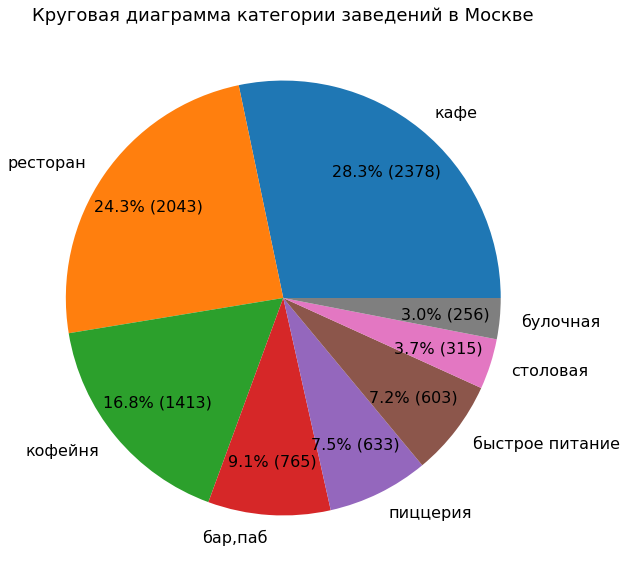

In [39]:
graf_pie(category_gr,'category','index','Круговая диаграмма категории заведений в Москве',size=[14,10])

- Лидер категория `кафе` - **28%** 2378 заведений
- Второе место `ресторан` - **24%** 2043 заведений
- Замыкает тройку `кофейня` - **17%** 1413 заведений

Построим график распределения для разнообразия

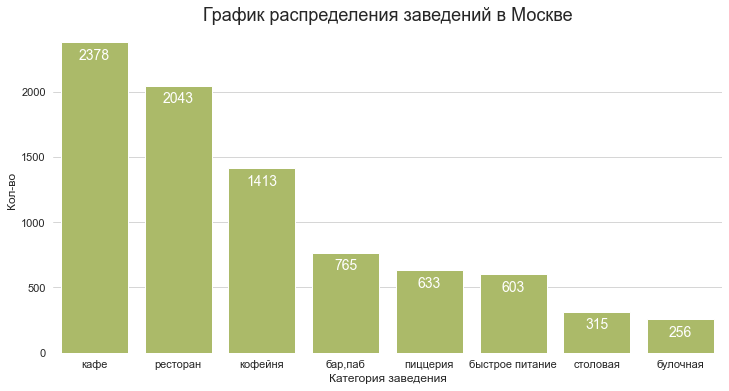

In [40]:
# назначаем стиль графика
sns.set_style('whitegrid')
# назначаем размер графика
plt.figure(figsize=(12, 6))
plt.box(False) #убрать рамку

# строим график
ax = sns.barplot(
    x='index', 
    y='category', 
    data=places['category'].value_counts().reset_index(), 
    color ='#b3c75c'
) 

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График распределения заведений в Москве', size=18)
plt.xlabel('Категория заведения', size=12)
plt.ylabel('Кол-во', size=12)
ax.tick_params(labelsize=11)
ax.bar_label(ax.containers[0], size=14 ,padding=-20, color='white');

Распределения по категориям:

- Лидер категория `кафе` - **28%** *2378* заведений
- Второе место `ресторан` - **24%** *2043* заведений
- Замыкает тройку `кофейня` - **17%** *1413* заведений


- Меньше всего у категории `булочная` - **3%** *256* заведений
- Далее всего у категории `столовая` - **4%** *315* заведений
- И у категории `быстрое питание` - **7%** *603* заведений

### Посмотрим распределение посадочных мест по категориям:

In [41]:
seats_group = places.groupby('category').agg({'seats':'median'}).reset_index().sort_values('seats', ascending=False)

seats_group

,category,seats
6,ресторан,86.0
0,"бар,паб",82.5
4,кофейня,80.0
7,столовая,75.5
2,быстрое питание,65.0
3,кафе,60.0
5,пиццерия,55.0
1,булочная,50.0


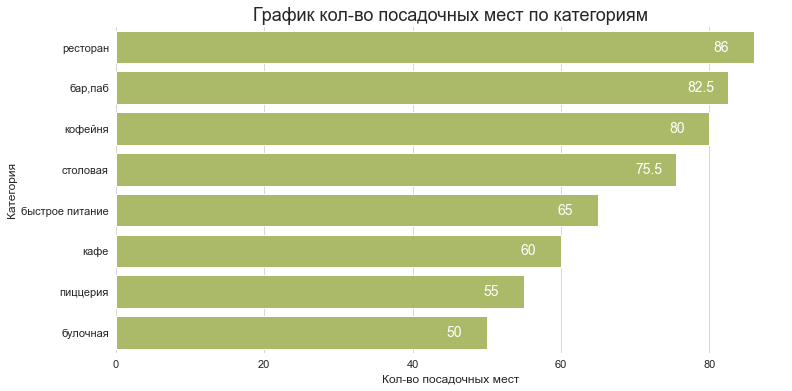

In [42]:
# назначаем стиль графика
sns.set_style('whitegrid')
# назначаем размер графика
plt.figure(figsize=(12, 6))
plt.box(False) #убрать рамку

# строим график
ax = sns.barplot(
    x='seats', 
    y='category', 
    data=seats_group,
    color ='#b3c75c'
) 

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График кол-во посадочных мест по категориям', size=18)
plt.xlabel('Кол-во посадочных мест', size=12)
plt.ylabel('Категория', size=12)
ax.tick_params(labelsize=11)
ax.bar_label(ax.containers[0], size=14 ,padding=-40, color='white');

In [43]:
seats_district_group = (
    places.groupby(['category','district'])
    .agg({'seats':'median'})
    .reset_index()
    .pivot_table(index='category', columns='district', values='seats', aggfunc='sum')
)
seats_district_group

district,Восточный,Западный,Северный,Северо-Восточный,Северо-Западный,Центральный,Юго-Восточный,Юго-Западный,Южный
category,,,,,,,,,
"бар,паб",95.5,96.5,70.0,66.0,85.0,90.0,55.0,63.0,80.0
булочная,36.0,90.0,35.0,98.0,45.5,50.0,77.0,50.0,30.0
быстрое питание,40.0,100.0,51.5,60.0,80.0,94.5,50.0,75.0,83.0
кафе,48.0,66.0,50.0,60.0,95.0,84.0,58.0,70.0,45.0
кофейня,55.0,96.0,66.0,75.0,87.5,86.0,50.0,64.5,80.0
пиццерия,42.5,70.0,55.0,70.0,57.5,90.0,45.0,48.0,45.0
ресторан,60.0,100.0,80.0,80.0,92.0,100.0,70.0,70.0,95.0
столовая,72.0,47.0,50.0,48.0,60.0,100.0,95.0,68.0,80.0


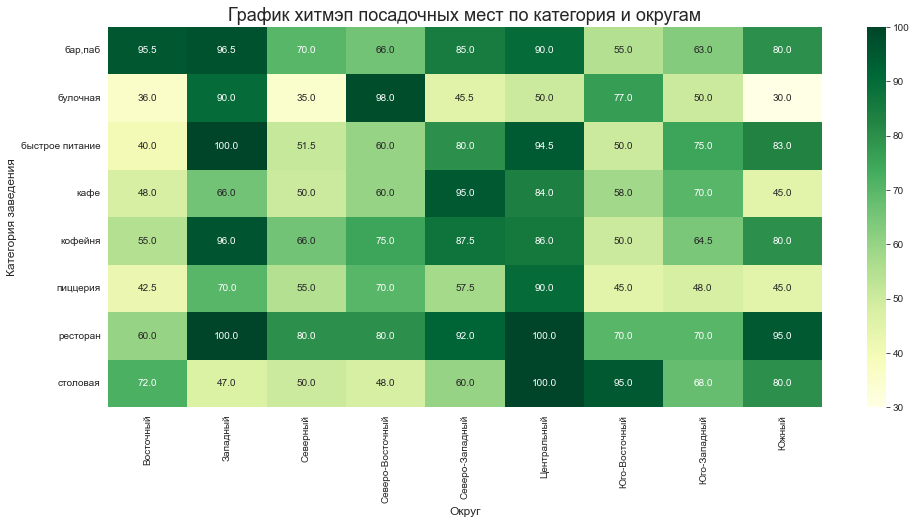

In [44]:
fig = plt.subplots(figsize =(16, 7))
sns.heatmap(seats_district_group, annot=True, cmap='YlGn', fmt='')
plt.title('График хитмэп посадочных мест по категория и округам', size=18)
plt.ylabel('Категория заведения', size=12)
plt.xlabel('Округ', size=12);

### Посмотрим на соотношение сетевых и несетевых заведений:

Для начала проверим не сетевые заведения с одинаковыми названиями (возможно сетевые), но по ошибки в базе относящиеся не к сетевым:

In [45]:
dup_chain = (
    places[(places['chain']==0)]#отфильтруим сгрупируем по названию и посчитаем
    .groupby(['name','category'])
    .agg({'address':'count'})
    .reset_index())

#сгрупируем и посчитаем по названию заведения
dup_chain = dup_chain[(dup_chain['address']>1)].sort_values('address', ascending=False) 

print('Всего таких заведений:',dup_chain['address'].sum())
print('Процент от всей базы: {}%'.format(round(dup_chain['address'].sum()/places.shape[0]*100)))
dup_chain

Всего таких заведений: 349
Процент от всей базы: 4%


,name,category,address
2507,Кафе,кафе,159
3697,Ресторан,ресторан,33
4712,Шаурма,быстрое питание,32
4051,Столовая,столовая,22
4713,Шаурма,кафе,10
2815,Кофейня,кофейня,9
2510,Кафе,ресторан,8
2506,Кафе,быстрое питание,7
2658,Кафе-столовая,столовая,7
4050,Столовая,кафе,6


- Всего таких заведений: **349**
- Процент от всей базы: **4%**

Ни одно название 100% нельзя назвать сетевым так как просто может быть совпадением.

Топ не очень креативных владельцов:
- У нас **159** кафе с названием "Кафе" вряд ли оно сетевое
- **33** ресторана с названием "Ресторан" 
- **32** с названием "Шаурма" из категории быстрое питание и **10** кафе с таким же названием
- **10** столовых с названием "Столовая"
- замыкает пятерку **9** кофейнен  с названием "Кофейня"

Посмотрим на соотношение сетевых и не сетевых заведений:

In [46]:
chain = places['chain'].value_counts()
chain.index = ['Не сетевые','Сетевые']
chain = chain.reset_index()
chain['ratio'] = round(chain['chain']/ places.shape[0] * 100)
chain

,index,chain,ratio
0,Не сетевые,5201,62.0
1,Сетевые,3205,38.0


Посмотрим на графике:

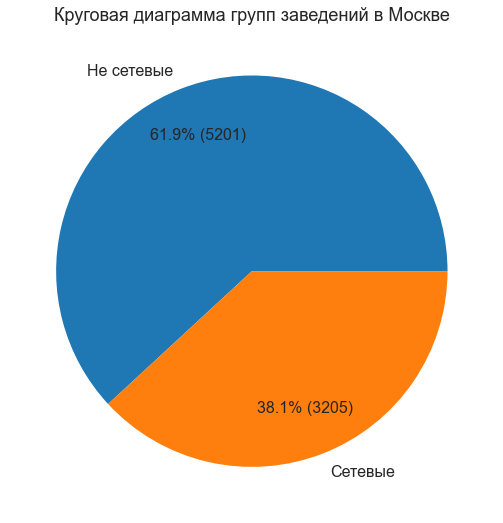

In [47]:
graf_pie(chain,'chain','index','Круговая диаграмма групп заведений в Москве')

В базе больше не сетевых заведений чуть больше чем в **1,6 раза**
- "не сетевых" **5201** заведений (*62%*)
- "сетевых" **3205** заведений (*38%*)

Посмотрим как разделяется категории заведений на сетевые и не сетевые:

In [48]:
group_s_n = places[['category','chain']].value_counts().reset_index()
group_s_n['group'] = 'Не сетевые'
group_s_n.loc[group_s_n['chain'] == 1, 'group'] = 'Сетевые'
group_s_n['ratio'] = round(group_s_n[0]/places.shape[0]*100,2)
group_s_n

,category,chain,0,group,ratio
0,кафе,0,1599,Не сетевые,19.02
1,ресторан,0,1313,Не сетевые,15.62
2,кафе,1,779,Сетевые,9.27
3,ресторан,1,730,Сетевые,8.68
4,кофейня,1,720,Сетевые,8.57
5,кофейня,0,693,Не сетевые,8.24
6,"бар,паб",0,596,Не сетевые,7.09
7,быстрое питание,0,371,Не сетевые,4.41
8,пиццерия,1,330,Сетевые,3.93
9,пиццерия,0,303,Не сетевые,3.60


Посмотрим на графике:

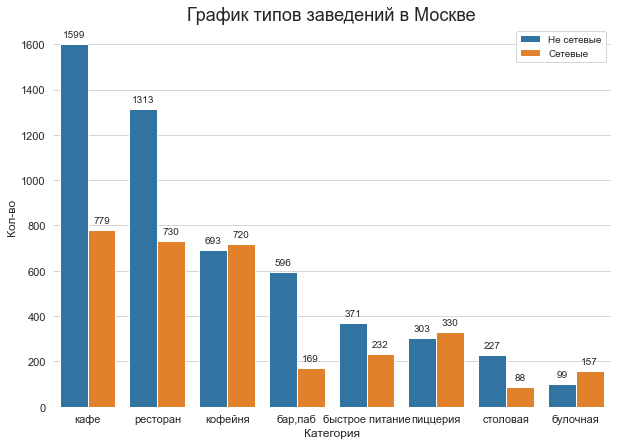

In [49]:
# назначаем стиль графика
sns.set_style('whitegrid')
# назначаем размер графика
plt.figure(figsize=(10, 7))
plt.box(False) #убрать рамку

# строим график
ax = sns.barplot(
    x='category', 
    y=0,
    hue='group',
    data=group_s_n
) 

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График типов заведений в Москве', size=18)
plt.ylabel('Кол-во', size=12)
plt.xlabel('Категория', size=12)
plt.legend(title='')
ax.tick_params(labelsize=11)
ax.bar_label(ax.containers[1], padding=5, size=10)
ax.bar_label(ax.containers[0], padding=5, size=10)
plt.show(ax)

Лидеры категорий что сетевые и не сетевые одинаковы:
- Лидер категория "кафе" 
    - `не сетевые` - **1599(19%)** заведений
    - `сетевые` - **779(9%)** заведений
- Вторая категория "ресторан" 
    - `не сетевые` - **1313(15%)** заведений
    - `сетевые` - **779(8,7%)** заведений
- Третья категория "кофейня" 
    - `не сетевые` - **693(8,2%)** заведений
    - `сетевые` - **779(8,6%)** заведений
    
Сетевых заведений больше чем не сетевых только в **3 категориях** из **8**:
 - "кофейня"
 - "пиццерия"
 - "булочная"

### Посмотрим на топ 15 сетевых заведений:

In [50]:
top_15 = places[places['chain']==1][['name','category']].value_counts().reset_index().head(15)
top_15['ratio'] = round(top_15[0]/sum(top_15[0])*100,2)
top_15

,name,category,0,ratio
0,Шоколадница,кофейня,119,15.49
1,Домино'с Пицца,пиццерия,76,9.90
2,Додо Пицца,пиццерия,74,9.64
3,One Price Coffee,кофейня,71,9.24
4,Яндекс Лавка,ресторан,69,8.98
5,Cofix,кофейня,65,8.46
6,Prime,ресторан,49,6.38
7,КОФЕПОРТ,кофейня,42,5.47
8,Кулинарная лавка братьев Караваевых,кафе,39,5.08
9,Теремок,ресторан,36,4.69


Посмотрим на графике:

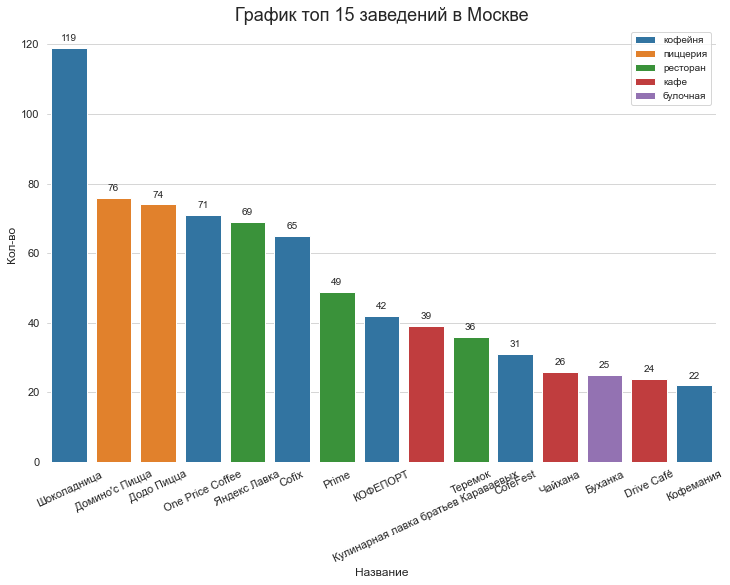

In [51]:
# назначаем стиль графика
sns.set_style('whitegrid')
# назначаем размер графика
plt.figure(figsize=(12, 8))
plt.box(False) #убрать рамку

# строим график
ax = sns.barplot(
    x='name', 
    y=0,
    hue='category',
    data=top_15,
    dodge=False
)

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График топ 15 заведений в Москве', size=18)
plt.ylabel('Кол-во', size=12)
plt.xlabel('Название', size=12)
plt.legend(title='')
plt.xticks(rotation=25)
ax.tick_params(labelsize=11)
for i in range(len(top_15['category'].value_counts())):
    ax.bar_label(ax.containers[i], padding=5, size=10)
plt.show(ax)

- Как видим лидер сетевиков это кофейня **"шоколадница"** с **119** заведениями(**15%** от топ 15),
- Затем две пиццерии **"Домино'с Пицца"** и **"Додо Пицца"** - **76** и **74** (**9,9%**  и **9,6%** от топ 15 соответственно)

Посмотрим как в топ 15 распределены категории:

In [52]:
top_15_group = top_15.groupby('category').agg({0:'sum'}).sort_values(0, ascending=False)
top_15_group['count'] = top_15['category'].value_counts()
top_15_group['ratio'] = round(top_15_group[0]/sum(top_15[0])*100,2)
top_15_group = top_15_group.reset_index()
top_15_group

,category,0,count,ratio
0,кофейня,350,6,45.57
1,ресторан,154,3,20.05
2,пиццерия,150,2,19.53
3,кафе,89,3,11.59
4,булочная,25,1,3.26


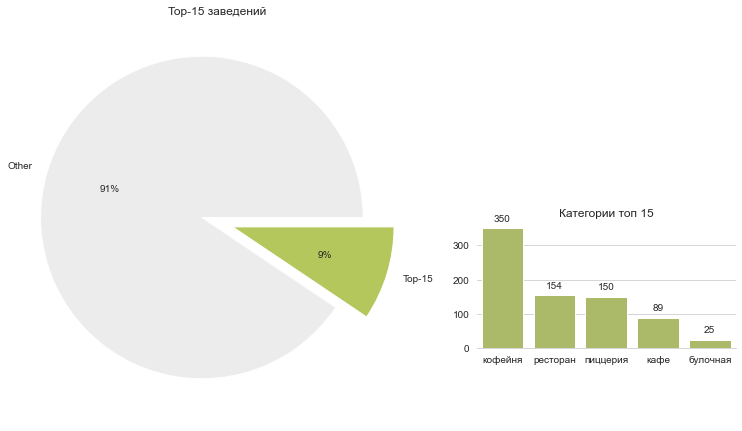

In [53]:
#делаем копию таблицы
places_top_15 = places.copy()

#маркируем в таблице улицы относящиеся к топ 15
places_top_15['is_top15'] = places_top_15['name'].isin(set(top_15['name']))


fig = plt.figure(figsize=(18, 7))
fig.patch.set_facecolor('xkcd:white')

ax1 = fig.add_axes([0.1, 0.1, 0.8, 0.8])
ax1.set_title("Top-15 заведений")
ax1.pie(places_top_15['is_top15'].value_counts(), labels=("Other", "Top-15"),
       autopct='%.0f%%', explode=[0.1, 0.1], colors=['#ECECEC', '#b3c75c'])

ax2 = fig.add_axes([0.7, 0.25, 0.2, 0.25])
ax2.set_title("Категории топ 15")

sns.despine(left=True, ax=ax2)
sns.barplot(data=top_15_group, x='category', y=0, color='#b3c75c', ax=ax2)
ax2.bar_label(ax2.containers[0], padding=5, size=10)
    
ax2.set_ylabel(None)
ax2.set_xlabel(None)
plt.show()


По категориям безоговорочный лидер **"кофейни" 6 заведения из 15**, далее **"ресторан" и "кафе"** по **3 заведения**

Если помотреть по количеству точек заведений здесь так же **лидируют "кофейни" 350 точек** и **45,6%** от всех точек топ 15, затем **"рестораны" и "пиццерии"** (**154 и 150** точек) примерно по **20%** от всех точек топ 15.

### Посмотрим какие административные районы Москвы присутствуют в базе:

In [54]:
district_gr = places['district'].value_counts().reset_index()
district_gr

,index,district
0,Центральный,2242
1,Северный,900
2,Южный,892
3,Северо-Восточный,891
4,Западный,851
5,Восточный,798
6,Юго-Восточный,714
7,Юго-Западный,709
8,Северо-Западный,409


Отобразим на диаграмме:

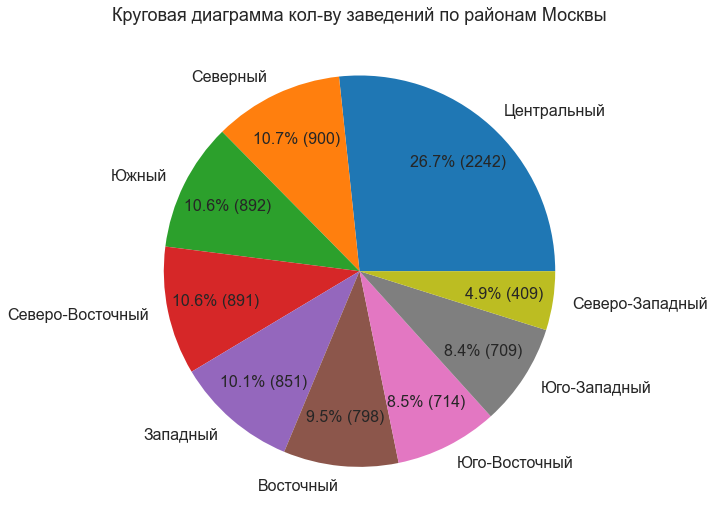

In [55]:
graf_pie(district_gr,'district','index','Круговая диаграмма кол-ву заведений по районам Москвы')

- **26%**(2242) заведения в `Центре` что 2.5 раза больше от ближайшего "приследователя"
- **10-10.7%** на `Севере`(900), `Юге`(892), `Северо-Востоке`(891), `Западе`(851)
- **8-9.5%** `Встоке`(798), `Юго-Востоке`(714) и `Юго-Западе`(709)
- **5%** `Севро-Западе`(409) замыкает гонку.

Отобразим как распределены различные категории в районах Москвы:

In [56]:
district_group = places[['category','district']].value_counts().reset_index()
district_group['ratio'] = round(district_group[0]/sum(district_group[0])*100,2)
district_group = (
    district_group
    .pivot_table(index='category', columns='district', values=0, aggfunc='sum')
    .sort_values('Центральный', ascending=False)
)

district_group

district,Восточный,Западный,Северный,Северо-Восточный,Северо-Западный,Центральный,Юго-Восточный,Юго-Западный,Южный
category,,,,,,,,,
ресторан,160,218,189,182,109,670,145,168,202
кафе,272,239,235,269,115,464,282,238,264
кофейня,105,150,193,159,62,428,89,96,131
"бар,паб",53,50,68,63,23,364,38,38,68
пиццерия,72,71,77,68,40,113,55,64,73
быстрое питание,71,62,58,82,30,87,67,61,85
столовая,40,24,41,40,18,66,25,17,44
булочная,25,37,39,28,12,50,13,27,25


Отобразим на графике:

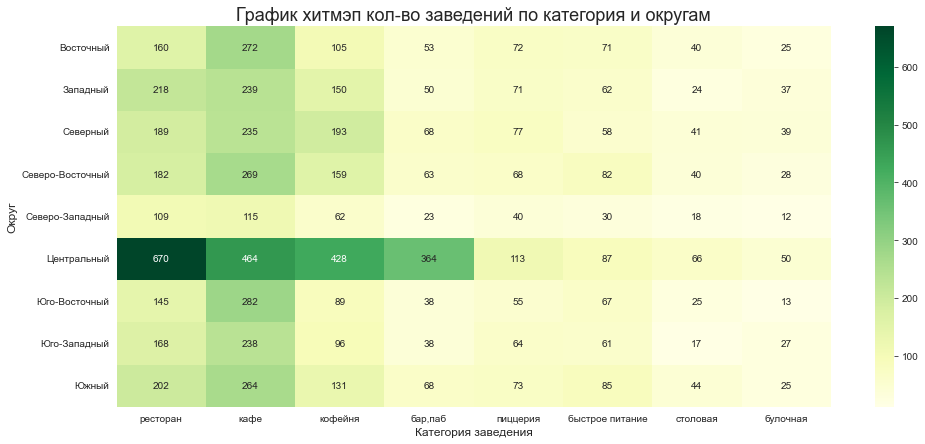

In [57]:
fig = plt.subplots(figsize =(16, 7))
sns.heatmap(district_group.T, annot=True, cmap='YlGn', fmt='');
plt.title('График хитмэп кол-во заведений по категория и округам', size=18)
plt.xlabel('Категория заведения', size=12)
plt.ylabel('Округ', size=12);

Видим что лидер по всем фронтам это Центрайльный округ тут больше всего заведений всех категорий.
Антилидер это Северо-Западный округ - возможно это связанно с тем что 46% територии это лесопарковые массивы, водоёмы, заповедные зоны.* *Википедия*

Далее распределение не равномерное, например в Юго-Восточном на втором месте по "кафе", но по "рестораном" он на предпоследнем.
И так по всему остальным округам.

Добавим колонку с суммой по всем округам:

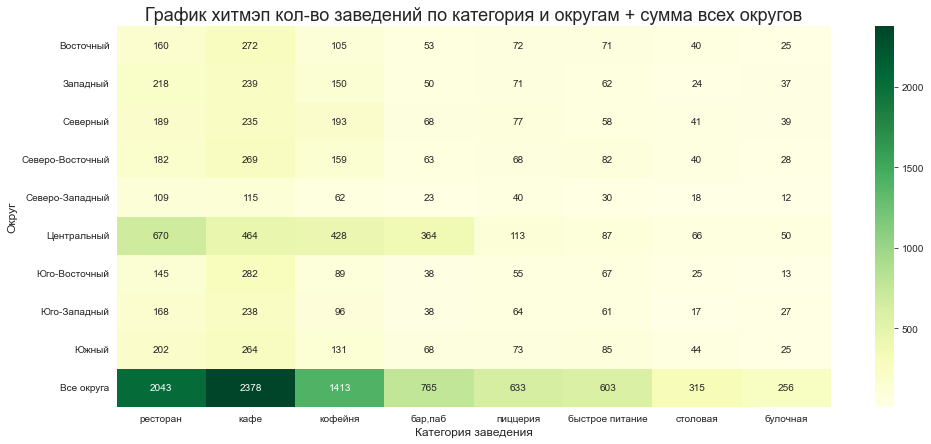

In [58]:
district_group_all = district_group.copy()
district_group_all['Все округа'] = district_group_all.sum(numeric_only=True, axis=1)

fig = plt.subplots(figsize =(16, 7))
sns.heatmap(district_group_all.T, annot=True,cmap='YlGn', fmt='');
plt.title('График хитмэп кол-во заведений по категория и округам + сумма всех округов', size=18)
plt.xlabel('Категория заведения', size=12)
plt.ylabel('Округ', size=12);

Так контраст еще более падает и все становится менее очевидным.

Сделаем данные отностительными и посмотрим еще раз на график:

In [59]:
district_group_ratio = district_group_all.copy()

for col in district_group_ratio.columns:
    district_group_ratio[col] = round(district_group_ratio[col] / district_group_ratio['Все округа']*100, 2)
    
district_group_ratio = district_group_ratio[district_group_ratio.columns[:-1]].T
district_group_ratio

category,ресторан,кафе,кофейня,"бар,паб",пиццерия,быстрое питание,столовая,булочная
district,,,,,,,,
Восточный,7.83,11.44,7.43,6.93,11.37,11.77,12.70,9.77
Западный,10.67,10.05,10.62,6.54,11.22,10.28,7.62,14.45
Северный,9.25,9.88,13.66,8.89,12.16,9.62,13.02,15.23
Северо-Восточный,8.91,11.31,11.25,8.24,10.74,13.60,12.70,10.94
Северо-Западный,5.34,4.84,4.39,3.01,6.32,4.98,5.71,4.69
Центральный,32.79,19.51,30.29,47.58,17.85,14.43,20.95,19.53
Юго-Восточный,7.10,11.86,6.30,4.97,8.69,11.11,7.94,5.08
Юго-Западный,8.22,10.01,6.79,4.97,10.11,10.12,5.40,10.55
Южный,9.89,11.10,9.27,8.89,11.53,14.10,13.97,9.77


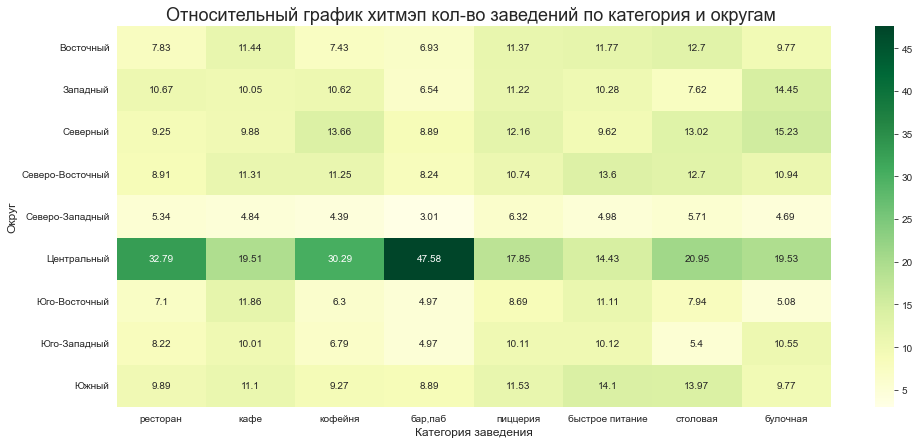

In [60]:
fig = plt.subplots(figsize =(16, 7))
sns.heatmap(district_group_ratio, annot=True,cmap='YlGn', fmt='');
plt.title('Относительный график хитмэп кол-во заведений по категория и округам ', size=18)
plt.xlabel('Категория заведения', size=12)
plt.ylabel('Округ', size=12);

Лидер и антилидер непокалебимы, но есть три основных категорий центрального округа:
- бары и пабы почти половина всех в центре 48%
- 1/3 всех ресторанов тоже в центре
- 30% кофеин так же в центре

Далее столовые 21% кафе и булочные по 19,5% и пиццерии 18% и фастфуд 14%

и по остальным есть изменения но из за малого контраста не видно, убирем лидера, анитилидера и посмотрим:

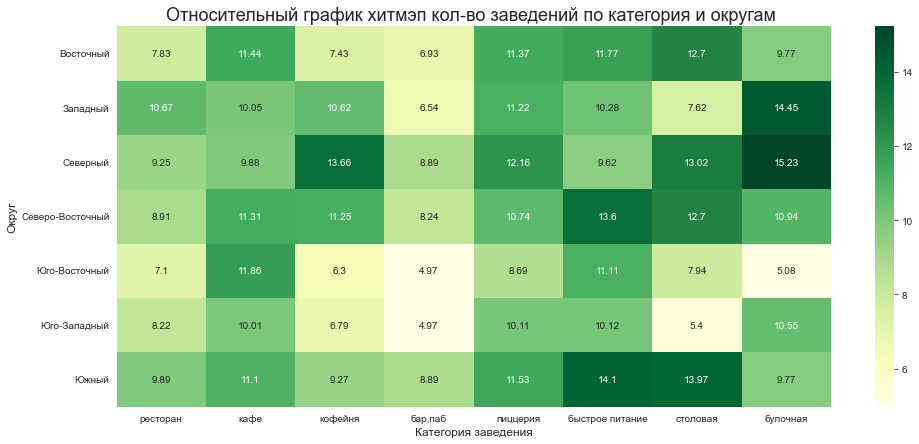

In [61]:
fig = plt.subplots(figsize =(16, 7))
sns.heatmap(district_group_ratio.drop(['Центральный','Северо-Западный'], axis=0), annot=True,cmap='YlGn', fmt='');
plt.title('Относительный график хитмэп кол-во заведений по категория и округам ', size=18)
plt.xlabel('Категория заведения', size=12)
plt.ylabel('Округ', size=12);

- оказывается больше всего пекут хлеб(булочных) в Северном округе - 15% и Западном округе - 14% (если конечно исключить Центральный округ), в Северном округе так же любят кофейни 13%
- фастфуд(14%) и столовые(14%) любят в Южном округе(Северо-Восточный чуть отстает от него)



В остальном все рядом с друг другом. 

### Посмотрим на распределение средних рейтингов по категориям заведений.

Построим таблицу по категориям с максимальной минимальной средними и медиальной оценками:

In [62]:
rating_median = (
    places.pivot_table(index='category', values='rating', aggfunc=('median', 'mean', 'max', 'min'))
    .sort_values('mean', ascending=False)
)
rating_median

,max,mean,median,min
category,,,,
"бар,паб",5.0,4.387712,4.4,1.1
пиццерия,5.0,4.301264,4.3,1.0
ресторан,5.0,4.290357,4.3,1.0
кофейня,5.0,4.277282,4.3,1.4
булочная,5.0,4.268359,4.3,1.3
столовая,5.0,4.211429,4.3,1.0
кафе,5.0,4.123886,4.2,1.0
быстрое питание,5.0,4.050249,4.2,1.1


Построим диаграмму размаха для сравнения оценок по категориям заведений:

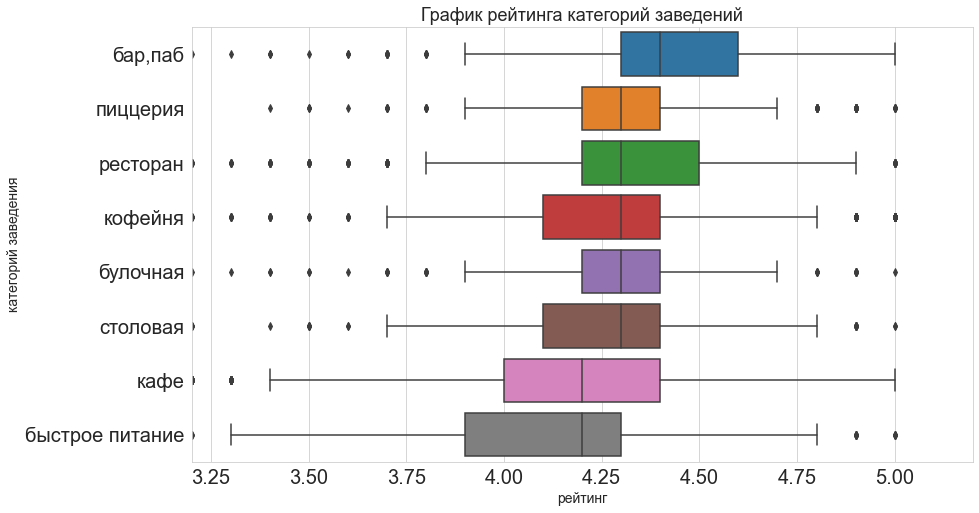

In [63]:


plt.figure(figsize=(14, 8))
ax = sns.boxplot(data=places, x="rating", y="category", dodge=False, order=rating_median.index);
ax.set_ylabel('категорий заведения', size=14)
ax.set_xlabel('рейтинг', size=14)
ax.tick_params(labelsize=20)
plt.title('График рейтинга категорий заведений', size=18)
plt.xlim(3.2, 5.2);

Немного "подрезаем" диаграмму(убираем выбросы в сторону минимальных оценок) видим что:
- Высший средний(медиальный) был у `баров` с оценкой **4.4**(4.4)
- С оценокой **4.3** идут по очереди `пиццерия`(4.3), `ресторан`(4.3), `кофейня`(4.3), `булочная`(4.3) и `столовая`(4.2).
- Замыкают с оценкой **4.2** `кафе`(4.1) и `фастфуд`(4)

### Посмотрим на среднию оценку по округам Москвы

In [64]:
district_rt = places.groupby(['district']).agg({'rating':'median'}).sort_values(by='rating').reset_index()
district_rt['district'] = district_rt['district'] + ' административный округ'
district_rt

,district,rating
0,Северо-Восточный административный округ,4.2
1,Юго-Восточный административный округ,4.2
2,Восточный административный округ,4.3
3,Западный административный округ,4.3
4,Северный административный округ,4.3
5,Северо-Западный административный округ,4.3
6,Юго-Западный административный округ,4.3
7,Южный административный округ,4.3
8,Центральный административный округ,4.4


Подготовим иконки для отображения на карте:

In [65]:
# ссылка на иконками
link_png = 'https://getfile.dokpub.com/yandex/get/https://disk.yandex.ru/d/5Czh72m2Iwqw4g/'
# словарь с иконками
names_png = {
    'быстрое питание':'bistro.png',
    'булочная':'bread.png',
    'кафе':'cafe.png',
    'бар,паб':'cocktail.png',
    'кофейня':'kawaii-coffee.png',
    'пиццерия':'pizza.png',
    'ресторан':'restaurant_01.png',
    'столовая':'stolovay.png',
    'beer':'test.png',
    'cup':'cup_coffee.png',
    'check':'receipt.png',
    'flag':'flag.png',
    'bars':'bars.png'
}

Напишем функцию для отображения данных на карте в виде хороплета:

In [66]:
def moscow_regions(df,col1,col2,title,color='YlGn', icon_list=None):
    # загружаем JSON-файл с границами округов Москвы
    with open(path_json, 'r', encoding='utf-8') as f:
        geo_json = json.load(f)
    
    # moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
    moscow_lat, moscow_lng = 55.751244, 37.618423

    # создаём карту Москвы
    m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
    
    # создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
    Choropleth(
        geo_data=geo_json,
        data=df,
        columns=[col1, col2],
        key_on='feature.name',
        fill_color='YlGn',
        fill_opacity=0.8,
        legend_name=title
    ).add_to(m)
    
    #координаты центров округов 
    #(частично взяты из json https://colab.research.google.com/drive/1i_JyLCVT7OxMDAUbqPuHrqAavRlj8u78?usp=sharing)
    lons = {'Восточный административный округ':37.77871413556669, 
        'Северный административный округ':37.50250505465452, 
        'Юго-Западный административный округ':37.544964, 
        'Юго-Восточный административный округ':37.771737114458645, 
        'Южный административный округ':37.66144717457541, 
        'Северо-Восточный административный округ':37.62211649418159, 
        'Центральный административный округ':37.61544980619323, 
        'Северо-Западный административный округ':37.42570067672262, 
        'Западный административный округ':37.470901}

    lats = {'Восточный административный округ':55.78783456676639,
        'Северный административный округ':55.85380761975098,
        'Юго-Западный административный округ':55.653469,
        'Юго-Восточный административный округ':55.692340446980204,
        'Южный административный округ':55.636568856110365,
        'Северо-Восточный административный округ':55.863545692349625,
        'Центральный административный округ':55.7536863364688,
        'Северо-Западный административный округ':55.821077389294935,
        'Западный административный округ':55.707220}
    
    marker_cluster = MarkerCluster().add_to(m)
    if icon_list != None:
        
        icon_url = link_png + names_png[icon_list[0]] 
        # создаём объект с собственной иконкой размером 50x50
        icon = CustomIcon(icon_url, icon_size=(50, 50))
        # создаём маркер с иконкой icon и добавляем его в кластер

        Marker(
            [55.883384, 37.195548],
            popup=f"{icon_list[1]}",
            icon=icon,
        ).add_to(marker_cluster)
    
    for key in lats:
        for i in range(len(df[col1])):
            if df[col1][i] == key:
                #собираем путь к файлу

                html_t = ('''<div style="
                      text-align: center;
                      vertical-align: 25%;
                      "><div style="
                      font-family: sans-serif;
                      font-weight: bold;
                      border-radius: 2em;
                      padding: 0.5em;
                      display: inline-block;
                      background: rgba(255, 255, 255, 0.7);;
                      font-size: 1em;
                      color: black; 
                      ">
                      {}
                      </div></div>'''.format(df[col2][i]))

                Marker(location=[lats[key], lons[key]], 
                  icon=DivIcon(
                      icon_size=(180, 20),
                      html=html_t)
                 ).add_to(m)
    
    
    # выводим карту
    return m

Применим функцию для отображения рейтинга на карте:

In [67]:
moscow_regions(
    district_rt,
    'district',
    'rating',
    'Медианный рейтинг заведений по районам',
    icon_list=['flag','Медианный рейтинг заведений по районам'])


- пять наблюдаем что лидер `Центр` с райтингом **4.4**
- отстающие `Юго-Восток` и `Северо-Восток` с **4.2** балами
- *все остальные* с оценкой **4.3**

Построим хотмеп для подробного отображения среднего рейтинга по заведениям и округам:

In [68]:
district_ct_rt = places.pivot_table(index='district', columns='category', values='rating', aggfunc='median')
district_ct_rt

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
Восточный,4.30,4.2,4.20,4.2,4.3,4.30,4.3,4.30
Западный,4.50,4.3,4.10,4.2,4.2,4.30,4.3,4.25
Северный,4.35,4.3,4.15,4.3,4.3,4.30,4.3,4.20
Северо-Восточный,4.30,4.3,4.20,4.2,4.3,4.25,4.3,4.20
Северо-Западный,4.40,4.3,4.05,4.2,4.3,4.30,4.3,4.20
Центральный,4.50,4.4,4.30,4.3,4.3,4.40,4.4,4.30
Юго-Восточный,4.40,4.2,4.10,4.2,4.3,4.30,4.3,4.20
Юго-Западный,4.40,4.3,4.20,4.2,4.3,4.30,4.3,4.20
Южный,4.40,4.4,4.20,4.2,4.3,4.30,4.3,4.30


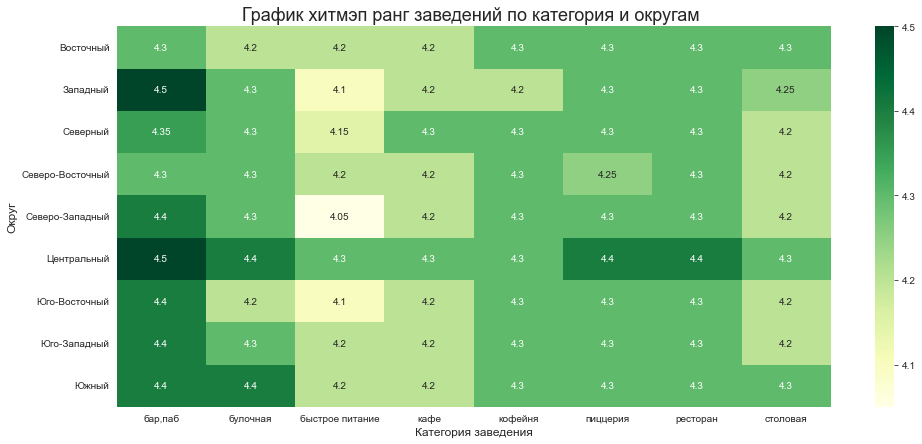

In [69]:
fig = plt.subplots(figsize =(16, 7))
sns.heatmap(district_ct_rt, annot=True,cmap='YlGn', fmt='');
plt.title('График хитмэп ранг заведений по категория и округам ', size=18)
plt.xlabel('Категория заведения', size=12)
plt.ylabel('Округ', size=12);

- Лучшии `пабы` в **Центре** и на **Севере 4.5**
- На **Юге** и в **Центре** `булочные` соценкой **4.4**
- `фастфуд` ниже всех(**4-4.2**) в целом, но лучший опять же в **Центре** **4.3** бала
- `кафе` везде 4.2 кроме **Центра** и **Севера** тут по **4.3** бала
- `кофейни` везде по **4.3** бала, хуже только на **Западе**.
- В **Центре** лучшие `пиццерии` и `рестораны` по **4.4** бала у остальных ниже на **0.1** бала
- Лучшии `столовые` в **Центре**, **Юге** и **Востоке**

### Отобразим все заведения на карте

In [70]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)


def create_clusters(row):
    # путь к иконкам
    
    # в соответсвии с каждой категории присваиваем свою иконку
    for key in names_png:
        if row['category'] == key:
            #собираем путь к файлу
            icon_url = link_png + names_png[key] 
            # создаём объект с собственной иконкой размером 50x50
            icon = CustomIcon(icon_url, icon_size=(50, 50))
            # создаём маркер с иконкой icon и добавляем его в кластер
            Marker(
                [row['lat'], row['lng']],
                popup=f"{row['name']} {row['rating']}",
                icon=icon,
            ).add_to(marker_cluster)
    
# применяем функцию для создания кластеров к каждой строке датафрейма
places.apply(create_clusters, axis=1)

# выводим карту
m

Отлично теперь можно увидеть каждое заведение на карте с названием и рейтингом.

### Посмотрим как распределены заведения по районам Москвы

In [71]:
street_district = (
        places.pivot_table(index='district', values=['name'], aggfunc=('count'))
     .reset_index().sort_values(by='name', ascending=False)
    )
street_district['district'] = street_district['district'] + ' административный округ'


moscow_regions(
    street_district,
    'district',
    'name',
    'Количество заведений по районам',
    icon_list=['bars','Ого как много'])

### Посмотрим топ-15 улиц по количеству заведений:

Посчитаем кол-во по улицам и отберем топ 15 улиц и по ним отфильтруем всю таблицу

In [72]:
ratio(
    places['street'].value_counts().reset_index().head(15),
    'street',
    'sum'
)

,index,street,ratio
0,проспект Мира,184,0.15
1,Профсоюзная улица,122,0.10
2,проспект Вернадского,108,0.09
3,Ленинский проспект,107,0.09
4,Ленинградский проспект,95,0.08
5,Дмитровское шоссе,88,0.07
6,Каширское шоссе,77,0.06
7,Варшавское шоссе,76,0.06
8,Ленинградское шоссе,70,0.06
9,МКАД,65,0.05


###### 

In [73]:
list_street_top_15 = list(places[['street']].value_counts().reset_index()['street'].head(15))
crop_street_top_15 = places.query("street in @list_street_top_15")
print('Всего колонок:',len(crop_street_top_15))
crop_street_top_15.head(5)

Всего колонок: 1258


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,avg_bill_text,middle_beer,street,is_24/7
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,Средний счёт,NaN,Дмитровское шоссе,False
12,Заправка,кафе,"Москва, МКАД, 80-й километр, 1",Северный,вт-сб 09:00–18:00,55.899938,37.517958,4.3,средние,Средний счёт:330 ₽,330.0,NaN,0,NaN,Средний счёт,NaN,МКАД,False
17,Чайхана Беш-Бармак,ресторан,"Москва, Ленинградское шоссе, 71Б, стр. 2",Северный,"ежедневно, круглосуточно",55.876908,37.449876,4.4,средние,Средний счёт:350–500 ₽,425.0,NaN,0,96.0,Средний счёт,NaN,Ленинградское шоссе,True
26,Пикочино,пиццерия,"Москва, Дмитровское шоссе, 107к2",Северный,"пн-чт 11:00–22:00; пт,сб 11:00–23:00; вс 11:00...",55.879390,37.541228,4.5,средние,Средний счёт:300–1500 ₽,900.0,NaN,0,NaN,Средний счёт,NaN,Дмитровское шоссе,False
28,Mafe,кафе,"Москва, МКАД, 78-й километр, 14к1",Северный,"ежедневно, 10:00–19:00",55.893061,37.501319,3.8,средние,Средний счёт:400–600 ₽,500.0,NaN,0,NaN,Средний счёт,NaN,МКАД,False


Подготовим данные к графику:

In [74]:
#собирим список улиц по убыванию на них заведений
colum_street = list(crop_street_top_15[['street']].value_counts().reset_index()['street']) 

#сделаем сводную таблицу
top_15_street_filter = (
    crop_street_top_15.pivot_table(index='street', columns='category', values='name', aggfunc='count')
    .sort_values('кафе', ascending=False)
    .T
)

#применим нашу сортировку
top_15_street_filter = top_15_street_filter[colum_street]


top_15_street_filter = top_15_street_filter.T.reset_index()

top_15_street_filter

category,street,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
0,проспект Мира,12.0,4.0,21.0,53.0,36.0,11.0,45.0,2.0
1,Профсоюзная улица,6.0,4.0,15.0,35.0,18.0,15.0,26.0,3.0
2,проспект Вернадского,7.0,1.0,12.0,25.0,16.0,12.0,33.0,2.0
3,Ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0
4,Ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0
5,Дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0
6,Каширское шоссе,2.0,NaN,10.0,20.0,16.0,5.0,19.0,5.0
7,Варшавское шоссе,6.0,NaN,7.0,18.0,14.0,4.0,20.0,7.0
8,Ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0
9,МКАД,1.0,NaN,9.0,45.0,4.0,NaN,5.0,1.0


Построим график:

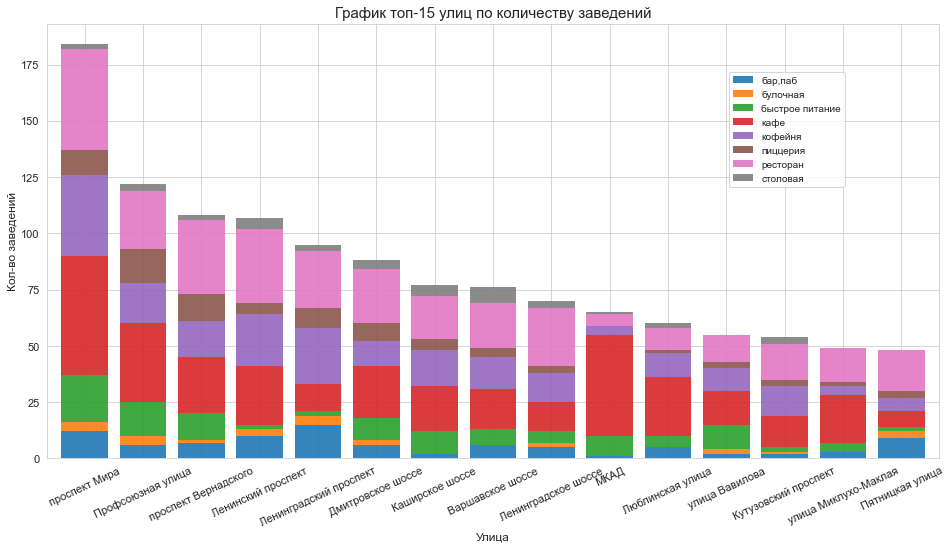

In [75]:
# назначаем стиль графика
sns.set_style('whitegrid')
# назначаем размер графика

ax = top_15_street_filter.set_index('street').plot(
    kind='bar', stacked=True , figsize=(16, 8), width=0.8, edgecolor = "none", alpha=0.9
)

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График топ-15 улиц по количеству заведений', size=15)
plt.ylabel('Кол-во заведений', size=12)
plt.xlabel('Улица', size=12)
plt.xticks(rotation=25)
plt.legend(bbox_to_anchor=(0.9, 0.9))
ax.tick_params(labelsize=11)

plt.show(ax);

 - Самая загруженная улица `проспект Мира` (основные:кафе - 53, рестораны - 45, кофейни - 36, быстрое питание - 21) с 184 заведения 15%
- `Профсоюзная улица` 122 заведений (10%) основные это кафе - 35, рестораны - 26, кофейни - 18
- `проспект Вернадского` 108 заведений (9%) основные это кафе - 25, рестораны - 33, кофейни - 16

Дополнительно выделяется `МКАД` с 46 кафе это 70% от всех его заведений.

Посмотрим как они распределяются по округам:

In [76]:
district_street_top = crop_street_top_15.groupby(['street']).first()['district'].value_counts().reset_index()
district_street_top['index'] = district_street_top['index'] + ' административный округ'

moscow_regions(
    district_street_top,
    'index',
    'district',
    'Количество улиц по районам',
    icon_list=['bars','Неожиданно'])

Большинство этих улицы многополосные шоссе основные артерии города.

Больше всего таких улиц на Севере 4 шт и Юго-Западе 3 шт

### Найдем улицы, на которых находится только один объект общепита

In [77]:
list_street_low = list(places['street'].value_counts().reset_index().sort_values('street').query("street == 1")['index'])
street_low = places.query("street in @list_street_low")
#street_low['ratio'] = round(top_15[0]/sum(top_15[0])*100,2)

print('Всего улиц с одним заведением:',len(street_low))
street_low.head(5)

Всего улиц с одним заведением: 458


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,avg_bill_text,middle_beer,street,is_24/7
15,Дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,Средний счёт,NaN,улица Бусиновская Горка,False
21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN,,NaN,Прибрежный проезд,False
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,,NaN,парк Левобережный,False
58,Coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,1,NaN,Средний счёт,NaN,Угличская улица,False
60,Чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,1,NaN,,NaN,ландшафтный заказник Лианозовский,False


In [78]:
street_low_gr =(street_low
.pivot_table(index='category', values=['rating','middle_avg_bill'], aggfunc=('median', 'count','max','min'))
.reset_index())

street_low_gr.columns = street_low_gr.columns.droplevel(-1)
street_low_gr.columns = [
    'category','count_d','max_m_bill','median_m_bill','min_m_bill','count','rating_max','rating_median','rating_min',
]

street_low_gr = street_low_gr[[
    'category','count','max_m_bill','median_m_bill','min_m_bill','rating_max','rating_median','rating_min'
]]

street_low_gr.sort_values(by='count', ascending=False)

,category,count,max_m_bill,median_m_bill,min_m_bill,rating_max,rating_median,rating_min
3,кафе,160,2000.0,500.0,67.0,5.0,4.20,1.4
6,ресторан,93,7000.0,1275.0,175.0,5.0,4.30,1.0
4,кофейня,84,1450.0,475.0,175.0,5.0,4.30,3.2
0,"бар,паб",39,4500.0,1250.0,650.0,5.0,4.50,3.9
7,столовая,36,400.0,275.0,200.0,4.9,4.30,3.0
2,быстрое питание,23,2750.0,450.0,125.0,5.0,4.30,3.0
5,пиццерия,15,1500.0,600.0,255.0,4.9,4.30,4.1
1,булочная,8,NaN,NaN,NaN,4.9,4.35,3.8


Одно заведение улице:
- чаще всего "кафе" 143 с средним чеком 500 и средним рейтингом 4,2
- "ресторан" 90 с средним чеком 1300 и средним рейтингом 4,3
- "кофейня" 75 с средним чеком 475 и средним рейтингом 4,3
- "бар,паб"	38	с средним чеком 1250.0 и средним рейтингом  4.45

Посмотрим как они распределены по округам:

In [79]:
# Посчитаем сколько улиц с одним заведением в каждом округе.
street_low_district = (
    street_low.groupby(['district'])
    .agg({'name':'count'})
    .sort_values(by='name', ascending=False)
    .reset_index()
)
# Посчитаем относительные значения от всех улиц с одним заведением улицами с одним заведением в округе.
ratio(street_low_district, 'name', 'sum')

# Посчитаем сколько уникальных улиц в каждом районе
street_district = (
    places.groupby('street').first()
    .pivot_table(index='district', values='name', aggfunc=('count'))
    .reset_index()
    .sort_values(by='name', ascending=False)
    .reset_index()
)
# Посчитаем относительные значения от кол-вом всех улиц в округе с кол-во одним заведением в округе.
ratio(street_district, 'name', 'sum')
# Перенесем данные по уникальным улицам
street_low_district['total_street'] = street_district['name']
# Посчитаем относительные значения от кол-во улиц в округе и улиц с одним заведением.
street_low_district['total_street_ratio'] = round(street_low_district['name'] / street_low_district['total_street'],2)

street_low_district['total'] = district_gr['district']
street_low_district['total_ratio'] = round(street_low_district['name'] / street_low_district['total'],2)

street_low_district

,district,name,ratio,total_street,total_street_ratio,total,total_ratio
0,Центральный,145,0.32,448,0.32,2242,0.06
1,Северо-Восточный,55,0.12,163,0.34,900,0.06
2,Восточный,52,0.11,159,0.33,892,0.06
3,Северный,52,0.11,148,0.35,891,0.06
4,Южный,43,0.09,142,0.30,851,0.05
5,Юго-Восточный,39,0.09,124,0.31,798,0.05
6,Западный,35,0.08,117,0.30,714,0.05
7,Северо-Западный,19,0.04,74,0.26,709,0.03
8,Юго-Западный,18,0.04,73,0.25,409,0.04


In [80]:
# Посчитаем сколько улиц с одним заведением в каждом округе.
street_low_district = (
    street_low.groupby(['district'])
    .agg({'name':'count'})
)

street_district = (
    places.groupby('street').first()
    .pivot_table(index='district', values='name', aggfunc=('count'))
)

street_low_district = pd.merge(district_gr.set_index('index'), street_low_district, left_index=True, right_index=True)
street_low_district = pd.merge(street_district, street_low_district, left_index=True, right_index=True)

street_low_district.columns = ['total_street','total','street_low']

street_low_district['more_1'] = street_low_district['total'] - street_low_district['street_low']

street_low_district['total_ratio'] = round(street_low_district['street_low'] / street_low_district['total'],2)
street_low_district['total_street_ratio'] = round(street_low_district['street_low'] / street_low_district['total_street'],2)

street_low_district = street_low_district.reset_index().sort_values(by='total', ascending=False)
street_low_district

,index,total_street,total,street_low,more_1,total_ratio,total_street_ratio
5,Центральный,448,2242,145,2097,0.06,0.32
2,Северный,148,900,52,848,0.06,0.35
8,Южный,142,892,43,849,0.05,0.30
3,Северо-Восточный,159,891,55,836,0.06,0.35
1,Западный,117,851,35,816,0.04,0.30
0,Восточный,163,798,52,746,0.07,0.32
6,Юго-Восточный,124,714,39,675,0.05,0.31
7,Юго-Западный,73,709,18,691,0.03,0.25
4,Северо-Западный,74,409,19,390,0.05,0.26


In [81]:
street_low_district[['total_ratio','total_street_ratio']].median()

total_ratio           0.05
total_street_ratio    0.31
dtype: float64

Построим график

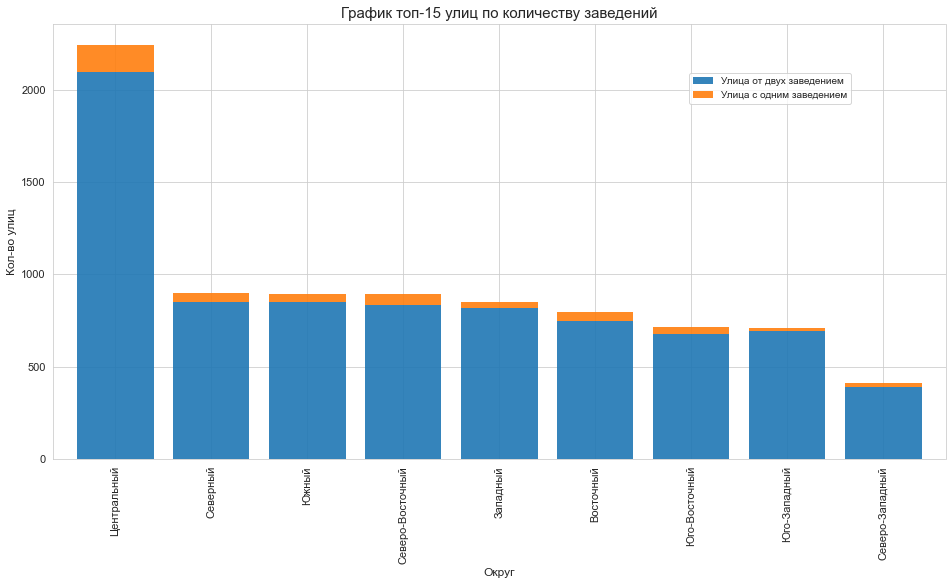

In [82]:
# назначаем стиль графика
sns.set_style('whitegrid')
# назначаем размер графика

ax = (
    street_low_district[['index','more_1','street_low']]
      .set_index('index')
      .plot(kind='bar', stacked=True , figsize=(16, 8), width=0.8, edgecolor = "none",alpha=0.9)
     )

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График топ-15 улиц по количеству заведений', size=15)

plt.ylabel('Кол-во улиц', size=12)
plt.xlabel('Округ', size=12)
plt.legend(['Улица от двух заведением','Улица с одним заведением'],bbox_to_anchor=(0.9, 0.9))
ax.tick_params(labelsize=11)

plt.show(ax);

В каждом районе есть заведения которые одни на улице в среднем **5%** от всех заведений в округе
В каждом районе есть улица с одним заведением в среднем **29%** от всех улиц в округе

- Меньше всего улиц с одни заведением в округе на `Юго-Западе` всего 69:
    - **2%** от всех заведений в округе 
    - **25%** от всех улиц в округе
- Больше всего улиц с одни заведением в округе на `Севере` и `Востоке` всего 142 и 157:  
    - **5%** и **6%**  от всех заведений в округе 
    - **33%** и **32%** от всех улиц в округе



Посмотрим как они расположены на карте:

In [83]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
s1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(s1)

street_low.apply(create_clusters, axis=1)

# выводим карту
s1

### Построим фоновую картограмму по среднему чеку в округах:

In [84]:
district_median_bill = places.pivot_table(index='district', values='middle_avg_bill', aggfunc='median').reset_index()
district_median_bill['district'] = district_median_bill['district'] + ' административный округ'

moscow_regions(
    district_median_bill,
    'district',
    'middle_avg_bill',
    'Медианный чек заведений по районам',
    icon_list=['check','Ого как много'])

- самый высокий средний чек в Центре и Западе - 1000р.
- самый низкий средний чек в Сверо-Востоке, Юге - 500р. и Юго-Востоке - 450р.

In [85]:
district_ct_mab = places.pivot_table(index='district', columns='category', values='middle_avg_bill', aggfunc='median')
district_ct_mab

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
Восточный,1200.0,300.0,375.0,450.0,400.0,500.0,1000.0,300.0
Западный,1250.0,600.0,367.5,625.0,600.0,700.0,1300.0,300.0
Северный,1250.0,625.0,300.0,550.0,325.0,650.0,1187.5,300.0
Северо-Восточный,900.0,500.0,425.0,475.0,325.0,500.0,837.5,275.0
Северо-Западный,1000.0,200.0,275.0,650.0,325.0,549.5,1250.0,300.0
Центральный,1250.0,962.5,450.0,700.0,500.0,1000.0,1250.0,300.0
Юго-Восточный,925.0,375.0,300.0,400.0,250.0,500.0,925.0,275.0
Юго-Западный,1000.0,500.0,375.0,450.0,375.0,500.0,1050.0,305.0
Южный,1175.0,437.5,400.0,600.0,387.5,500.0,975.0,282.5


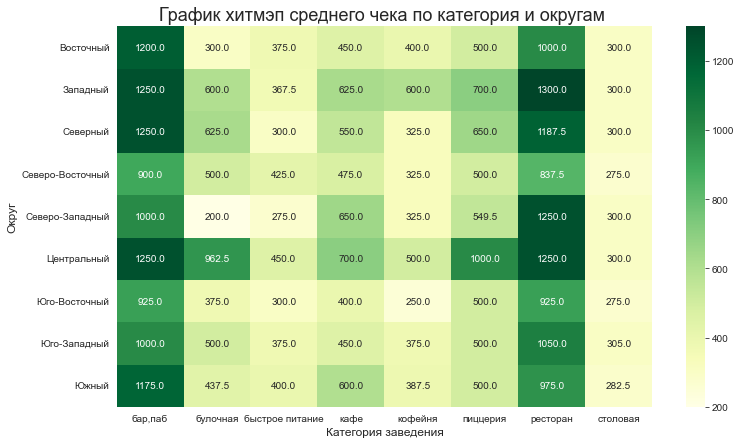

In [86]:
fig = plt.subplots(figsize =(12, 7))
sns.heatmap(district_ct_mab, annot=True,cmap='YlGn', fmt='');
plt.title('График хитмэп среднего чека по категория и округам ', size=18)
plt.xlabel('Категория заведения', size=12)
plt.ylabel('Округ', size=12);

По категориям:
- Выгоднее всего открывать `бар`(**900-1250**) и `ресторан` (**837-1300**)
    - **Самые выгодные округа** для `бара`
        - Центр, Север и Запад - средний чек 1250р.
    - **Самые выгодные округа** для `ресторана`
        - Запад - средний чек 1300р, Центр и Северо-Запад - средний чек 1250р.
    
    
 - Самые не выгодные это `столовая` (**275-305**) и `быстрое питание` (**275-450**)   
     - **Самые не выгодные округа** для `столовая`
        - Север-Восток и Юго-Восток - средний чек 275р.
    - **Самые не выгодные округа** для `быстрое питание`
        - Северо-Запад - средний чек 275, Север и Юго-Восток - средний чек 300р.

In [87]:
district_median_coffee = places.pivot_table(index='district', values='middle_coffee_cup', aggfunc='median').reset_index()
district_median_coffee['district'] = district_median_coffee['district'] + ' административный округ'

moscow_regions(
    district_median_coffee,
    'district',
    'middle_coffee_cup',
    'Цена чашки капучино в кофейнях по районам',
    icon_list=['cup','Кофе со сливками, смешать но не взбалтывать!'])

- самый дорогая чашка капучино на Юго-Западе - 197р. в Центре - 190р., Западе - 187р., 
- самый доступная чашка капучино на Востоке - 135р., Юго-Востоке - 145р., Юге - 149,5р.

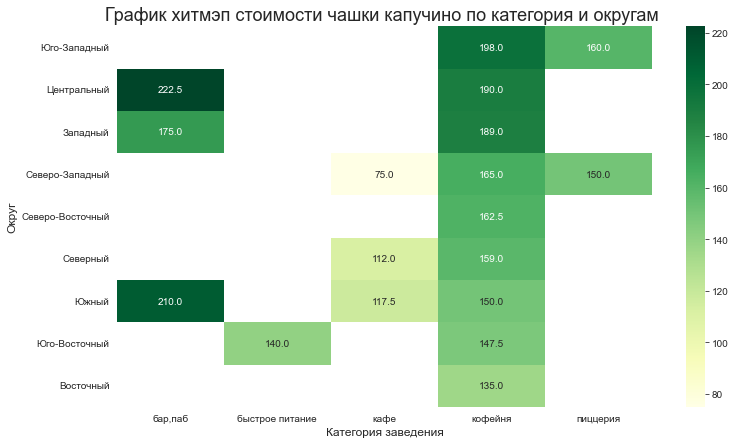

In [88]:
district_ct_mcc = (
    places.pivot_table(index='district', columns='category', values='middle_coffee_cup', aggfunc='median')
    .sort_values(by='кофейня', ascending=False)
)
fig = plt.subplots(figsize =(12, 7))
sns.heatmap(district_ct_mcc, annot=True,cmap='YlGn', fmt='');
plt.title('График хитмэп стоимости чашки капучино по категория и округам ', size=18)
plt.xlabel('Категория заведения', size=12)
plt.ylabel('Округ', size=12);

Чашка капучино по категориям:
- Выгоднее всего открывать `бар`(**175-222,5**) и `кофейня` (**135-198**)
    - **Самые выгодные округа** для `бара`
        - Центр - 222,5, Южный - 210, Запад - 175
    - **Самые выгодные округа** для `кофейня`
        - Юго-Запад - 198, Центр - 190, Запад - 189
    
    
 - Самые не выгодные это `кафе` (**75-117,5**) и `быстрое питание` (**140**)   
     - **Самые не выгодные округа** для `кафе`
        - Северо-Запад - 75, Север - 112, Южный - 117
    - **Самые не выгодные округа** для `быстрое питание`
        - Юго-Восток - 140

In [89]:
district_median_beer = places.pivot_table(index='district', values='middle_beer', aggfunc='median').reset_index()
district_median_beer['district'] = district_median_beer['district'] + ' административный округ'

moscow_regions(
    district_median_beer,
    'district',
    'middle_beer',
    'Медианный цена пива в барах по районам',
    icon_list=['beer','Бармен кружку пиво пожалуйста!']
)

- самый дорогая кружка пива в Центре - 335р., Юго-Востоке, Северо-Востоке - 300р., Западе - 297,5р.
- самый доступная кружка пива на Север - 250р., Востоке - 260р., Юге - 265р.

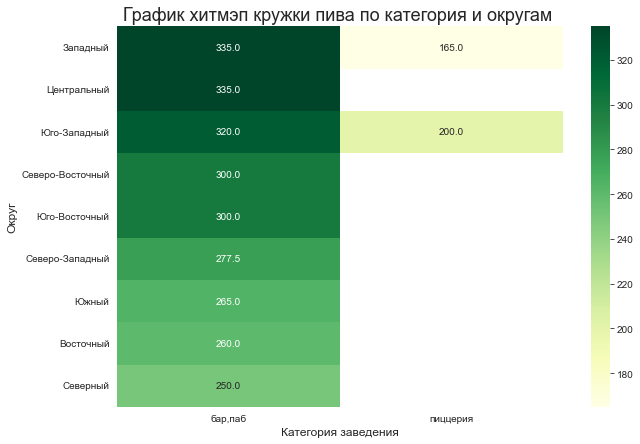

In [90]:
district_ct_mb = (
    places.pivot_table(index='district', columns='category', values='middle_beer', aggfunc='median')
    .sort_values(by='бар,паб', ascending=False)
)
fig = plt.subplots(figsize =(10, 7))
sns.heatmap(district_ct_mb, annot=True,cmap='YlGn', fmt='');
plt.title('График хитмэп кружки пива по категория и округам ', size=18)
plt.xlabel('Категория заведения', size=12)
plt.ylabel('Округ', size=12);

Разделение категорий только на бары(250-335р.) и пиццерии(200-165р.), причем неожиданно пиво в пиццерии доступнее чем в барах(пабах).

- Самое дорогое пиво на Западе и Центре - 335р.
- Самое доступное на Севере(250р.) и Востоке(260р.)

### Выводы:

Два самых выгодных категории заведения `бар/паб` и `ресторан`

- Самые выгодные округа для `бара` со средним чеком 1250₽ 
	- Центральный округ, но здесь высокая конкуренция
	- Западный округ при том же чеке конкуренция в 7 раз ниже

- Самые выгодные округа для `ресторана`
	- Западный округ с средним чеком 1300₽ конкуренция ниже 3 раз 
	- Центральный округ, при высокая конкуренция средний чек 1250₽
	- Северо-Запад  при том же чеке конкуренция в 6 раз ниже
 
- Количество посадочных мест находится в среднем от 50 до 86.

## Детализируем исследование: открытие кофейни

По просьбе заказчика углубляемся отдельно в тему кофейн.

### Посмотрим сколько всего кофеен в таблице?

In [91]:
coffee_house = places.query('category == "кофейня"').reset_index(drop=True)
print("Всего кофеен в датасете:",len(coffee_house))
print("Относительно всех заведений:",round(len(coffee_house)/places.shape[0],2))
coffee_house.head(5)

Всего кофеен в датасете: 1413
Относительно всех заведений: 0.17


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,avg_bill_text,middle_beer,street,is_24/7
0,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,Цена чашки капучино,NaN,улица Маршала Федоренко,False
1,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,,NaN,парк Левобережный,False
2,9 Bar Coffee,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",Северный,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,1,46.0,,NaN,Коровинское шоссе,False
3,CofeFest,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,,NaN,улица Маршала Федоренко,False
4,Cofix,кофейня,"Москва, улица Дыбенко, 7/1",Северный,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,1,NaN,,NaN,улица Дыбенко,False


В таблице всего 1413 кофейн 17% от всех данных.

Посмотрим как они деляться по округам:

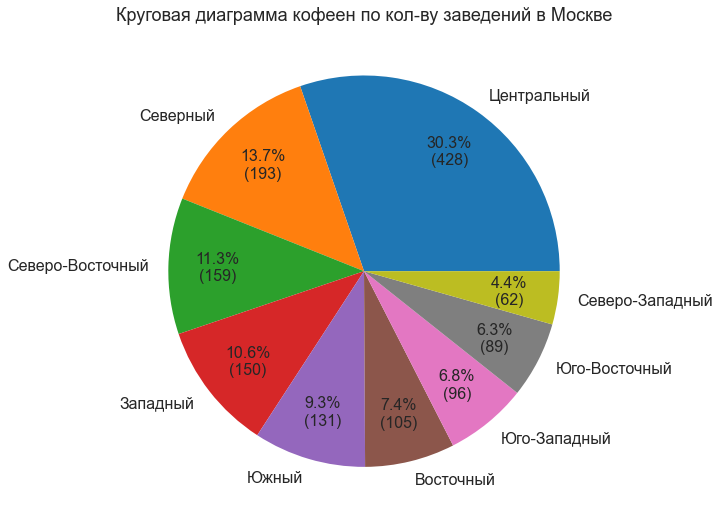

In [92]:
coffee_house_distr = coffee_house.groupby('district').agg({'name':'count'}).sort_values('name', ascending=False).reset_index()

graf_pie(coffee_house_distr,'name','district','Круговая диаграмма кофеен по кол-ву заведений в Москве',enter=True)

Больше всего в Центре 30% (428) кофейн.
Далее Север 13%(193) и Северо-Восток 11%(159)

Меньше всего Северо-Востоке 4,4%(62), Юго-Востоке 6,3%(89) и Юго-Западе 6,8%(96) 

Собирем общие данные по округам:

In [93]:
coffee_house_distr_gr = (
    coffee_house.groupby(['district','chain'])
    .agg({'name':'count','rating':'median','middle_avg_bill':'median','middle_coffee_cup':'median','seats':'median'})
    .sort_values('name', ascending=False)
    .reset_index()
)
coffee_house_distr_gr['chais_text'] = 'Сетевые'
coffee_house_distr_gr.loc[coffee_house_distr_gr['chain']== 0 ,'chais_text'] = 'Не сетевые'

coffee_house_distr_gr

,district,chain,name,rating,middle_avg_bill,middle_coffee_cup,seats,chais_text
0,Центральный,1,221,4.30,750.0,180.0,100.0,Сетевые
1,Центральный,0,207,4.40,462.5,195.0,50.0,Не сетевые
2,Северный,1,97,4.20,400.0,140.0,60.5,Сетевые
3,Северный,0,96,4.40,264.5,165.0,70.0,Не сетевые
4,Западный,1,93,4.20,650.0,222.5,96.0,Сетевые
5,Северо-Восточный,0,80,4.35,300.0,162.5,52.0,Не сетевые
6,Северо-Восточный,1,79,4.20,525.0,162.0,85.0,Сетевые
7,Южный,1,66,4.20,350.0,109.5,75.0,Сетевые
8,Южный,0,65,4.40,750.0,170.0,80.0,Не сетевые
9,Юго-Восточный,0,60,4.35,250.0,150.0,54.0,Не сетевые


Разделим на сетевые и не сетевые.

In [94]:
coffee_house_distr_gr['district'] = coffee_house_distr_gr['district'] + ' административный округ'
coffee_house_distr_gr_0 = coffee_house_distr_gr[coffee_house_distr_gr['chain']==0].reset_index(drop=True)
coffee_house_distr_gr_1 = coffee_house_distr_gr[coffee_house_distr_gr['chain']==1].reset_index(drop=True)

Выведем рейтинг не сетевых кофейн по округам:

In [95]:
moscow_regions(
    coffee_house_distr_gr_0,
    'district',
    'rating',
    'Рейтинг сетевых кофейн по районам',
    icon_list=['cup','Кофе со сливками, смешать но не взбалтывать!'])

- Самый высокий рейтинг 4.45 у Северо-Запада
- Далее Центр, Север, Восток, Юг, Юго-Запад по 4.4 балла


- Самый низкий у Запада 4.3 балла

Выведем рейтинг сетевых кофейн по округам:

In [96]:
moscow_regions(
    coffee_house_distr_gr_1,
    'district',
    'rating',
    'Рейтинг не сетевых кофейн по районам',
    icon_list=['cup','Кофе со сливками, смешать но не взбалтывать!'])

- самый высокий рейтинг 4.3 в Центре и Юго-Западе
- у остальных 4.2

Построим графики по кол-ву кофейн, среднему чеку, стоимости капучино и посадочным местам в округах

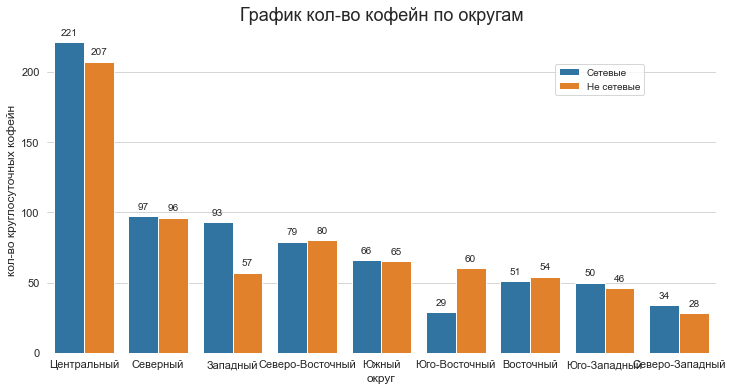

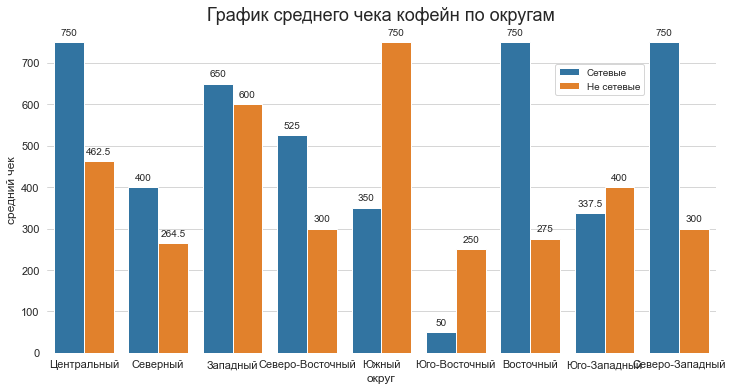

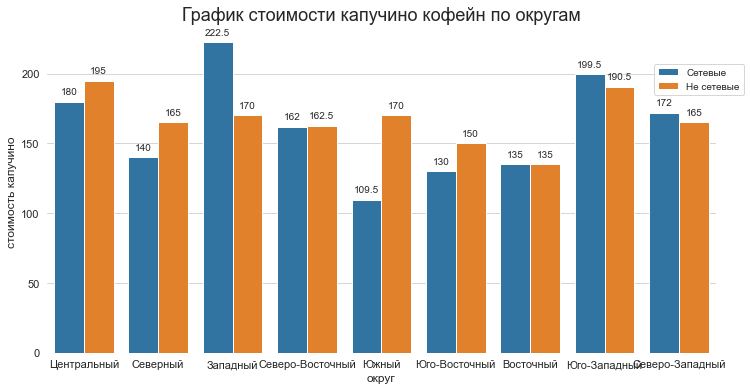

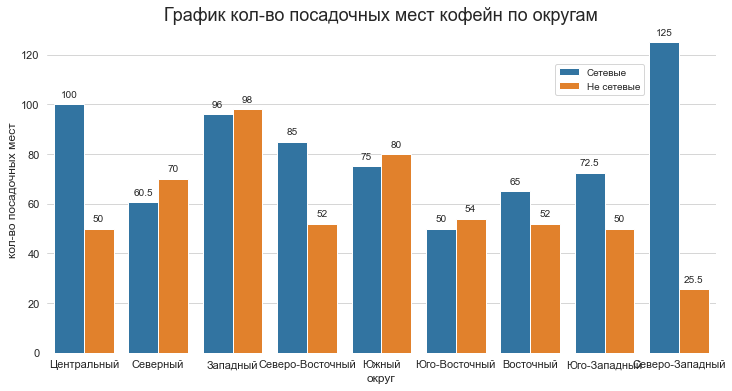

In [97]:
coffee_house_distr_gr['district'] = coffee_house_distr_gr['district'].map(
    lambda x: ' '.join(x.split()[:-2])
)

col_grf = ['name','middle_avg_bill','middle_coffee_cup','seats']
name_grf = [
    'График кол-во кофейн по округам',
    'График среднего чека кофейн по округам',
    'График стоимости капучино кофейн по округам',
    'График кол-во посадочных мест кофейн по округам'
]
y_name=[
    'кол-во круглосуточных кофейн',
    'средний чек',
    'стоимость капучино ',
    'кол-во посадочных мест'
]

for i in range(len(col_grf)):
    # назначаем стиль графика
    sns.set_style('whitegrid')
    # назначаем размер графика
    plt.figure(figsize=(12, 6))
    plt.box(False) #убрать рамку

    # строим график
    ax = sns.barplot(
        x='district', 
        y=col_grf[i], 
        hue='chais_text',
        data=coffee_house_distr_gr.drop('rating', axis=1)
    ) 

    # формируем заголовок графика и подписи осей средствами matplotlib
    plt.title(name_grf[i], size=18)
    plt.xlabel('округ', size=12)
    plt.ylabel(y_name[i], size=12)
    plt.legend(bbox_to_anchor=(0.9, 0.9))
    for i in range(len(coffee_house_distr_gr['chais_text'].value_counts())):
        ax.bar_label(ax.containers[i], padding=5, size=10)
    ax.tick_params(labelsize=11)

#### Кол-во сетевых и не сетевых кофейн по округам:

Разделение на сетевые и не сетевые по округам почти везде равное, кроме:
- Западного здесь сетевых(93) в 1,6 раза больше чем не сетевых(57)
- Юго-Восточного здесь не сетевых(60) в 2 раза больше чем не сетевых(29)

Больше всего и сетевых и не сетевых кофейн в Центре 221 и 207 кофейн

#### Средний чек сетевых и не сетевых кофейн по округам

- Самые высокие средние чеки по 750р в Центре(сетевые), Юге(не сетевые), Востоке(сетевые) и Северо-Западе(сетевые)

- Самые низкие средние чеки Юго-Востоке(сетевые - 50, не сетевые - 250)

#### Стоимость капучино в сетевых и не сетевых кофейн по округам:

- Самое дорогое капучино:
    - Западе(сетевые) - 222,5
    - Юго-Западе(сетевые - 199,5, не сетевые - 190,5) 
    - Центре (сетевые - 180, не сетевые - 195)
    
    
- Самое доступное капучино:
    - Юге(сетевые) - 109,5
    - Юго-Востоке(сетевые - 130) 
    - Востоке (сетевые - 135)

#### Кол-во посадочных мест в сетевых и не сетевых кофейн по округам:

Самые большые компании могут разместиться на:
- Северо-Западе(сетевые) 125 посадочных мест
- Центре (сетевые) 100 посадочных мест

им же стоит избегать:
- Северо-Запада(не сетевые) 25,5 посадочных мест

### Посмотрим есть ли и если есть сколько круглосуточных кофейн

In [98]:
coffee_house_24 = coffee_house[coffee_house['hours'].fillna('Не известно').str.contains("круглосуточно", case=False)]
print('Всего круглосуточных кофейн:',len(coffee_house_24))
print("Относительно всех заведений:",round(len(coffee_house_24)/coffee_house.shape[0],2))
coffee_house_24.head(5)

Всего круглосуточных кофейн: 76
Относительно всех заведений: 0.05


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,avg_bill_text,middle_beer,street,is_24/7
26,Wild Bean,кофейня,"Москва, Дмитровское шоссе, 107Е",Северный,"ежедневно, круглосуточно",55.878477,37.543426,3.5,NaN,NaN,NaN,NaN,1,20.0,,NaN,Дмитровское шоссе,True
153,Wild Bean Cafe,кофейня,"Москва, Ярославское шоссе, 116",Северо-Восточный,"ежедневно, круглосуточно",55.867822,37.708853,4.0,NaN,NaN,NaN,NaN,1,25.0,,NaN,Ярославское шоссе,True
170,Wild Bean Cafe,кофейня,"Москва, Ярославское шоссе, вл3с3",Северо-Восточный,"ежедневно, круглосуточно",55.851778,37.676423,4.5,NaN,Цена чашки капучино:140–200 ₽,NaN,170.0,1,NaN,Цена чашки капучино,NaN,Ярославское шоссе,True
192,Wild Bean Cafe,кофейня,"Москва, МКАД, 65-й километр, 8",Северо-Западный,"ежедневно, круглосуточно",55.813787,37.390701,4.3,NaN,NaN,NaN,NaN,1,NaN,,NaN,МКАД,True
204,Шоколадница,кофейня,"Москва, улица Народного Ополчения, 49, корп. 1",Северо-Западный,"ежедневно, круглосуточно",55.794815,37.494834,4.2,средние,Средний счёт:650–850 ₽,750.0,NaN,1,200.0,Средний счёт,NaN,улица Народного Ополчения,True


76 круглосуточных кофейн на Москву в базе.

Посмотрим как они распологаются по округам:

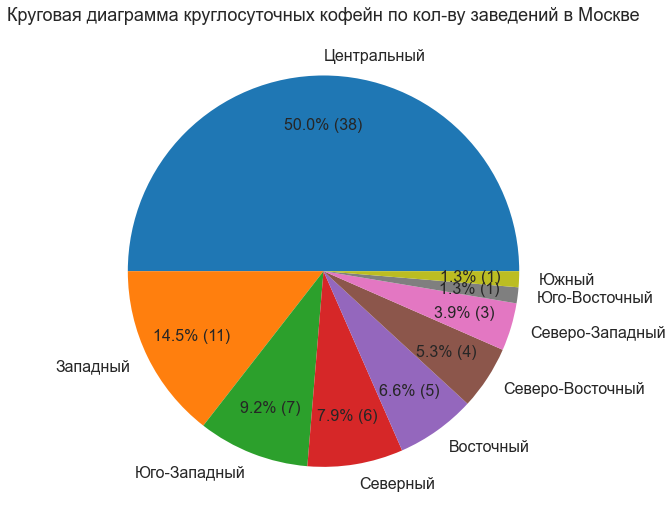

In [99]:
coffee_house_distr_24 = (
    coffee_house_24.groupby('district')
    .agg({'name':'count'})
    .sort_values('name', ascending=False)
    .reset_index()
)

graf_pie(coffee_house_distr_24,'name','district','Круговая диаграмма круглосуточных кофейн по кол-ву заведений в Москве')

Половина всех круглосуточных кофейн в Центре(50%) - 38 шт.

Меньше всего Юге, Юго-Востоке по 1 шт. и Северо-Западе - 3 шт.

Собирем общие данные по круглосуточных кофейн в округах:

In [100]:
coffee_house_distr_24 = (
    coffee_house_24.groupby(['district','chain'])
    .agg({'name':'count','rating':'median','middle_avg_bill':'median','middle_coffee_cup':'median','seats':'median'})
    .sort_values('name', ascending=False)
    .reset_index()
)
coffee_house_distr_24['chais_text'] = 'Сетевые'
coffee_house_distr_24.loc[coffee_house_distr_24['chain']== 0 ,'chais_text'] = 'Не сетевые'

coffee_house_distr_24

,district,chain,name,rating,middle_avg_bill,middle_coffee_cup,seats,chais_text
0,Центральный,1,32,4.20,2000.0,256.0,144.0,Сетевые
1,Западный,1,10,4.20,1100.0,265.5,49.5,Сетевые
2,Северный,1,6,4.15,NaN,305.0,20.0,Сетевые
3,Центральный,0,6,4.40,1250.0,229.0,78.5,Не сетевые
4,Восточный,1,5,4.20,400.0,110.0,49.0,Сетевые
5,Юго-Западный,1,5,4.30,NaN,256.0,48.0,Сетевые
6,Северо-Восточный,1,4,4.05,NaN,213.0,25.0,Сетевые
7,Северо-Западный,1,3,4.20,750.0,NaN,165.0,Сетевые
8,Юго-Западный,0,2,4.20,NaN,230.0,20.0,Не сетевые
9,Западный,0,1,4.10,NaN,NaN,10.0,Не сетевые


Разделим на сетевые и не сетевые.

In [101]:
coffee_house_distr_24['district'] = coffee_house_distr_24['district'] + ' административный округ'
coffee_house_distr_24_0 = coffee_house_distr_24[coffee_house_distr_24['chain']==0].reset_index(drop=True)
coffee_house_distr_24_1 = coffee_house_distr_24[coffee_house_distr_24['chain']==1].reset_index(drop=True)

Выведем рейтинг не сетевых круглосуточных кофейн по округам:

In [102]:
moscow_regions(
    coffee_house_distr_24_0,
    'district',
    'rating',
    'Рейтинг не сетевых круглосуточных кофейн по районам',
    icon_list=['cup','Кофе со сливками, смешать но не взбалтывать!'])

- с самый высоким рейтингом только в Центре 4,4 
- на Юго-Западе - 4,2
- Западе 4,1

Выведем рейтинг сетевых круглосуточных кофейн по округам:

In [103]:
moscow_regions(
    coffee_house_distr_24_1,
    'district',
    'rating',
    'Рейтинг сетевых круглосуточных кофейн по районам',
    icon_list=['cup','Кофе со сливками, смешать но не взбалтывать!'])

- Самый высокий рейтинг 4.3 у Юго-Запада
- Далее Центр, Запада, Восток, Северо-Запад по 4.2 балла


- Самый низкий у Юго-Востока 2.3 балла - одна кофейня с плохим рейтингом, но круглосуточная.

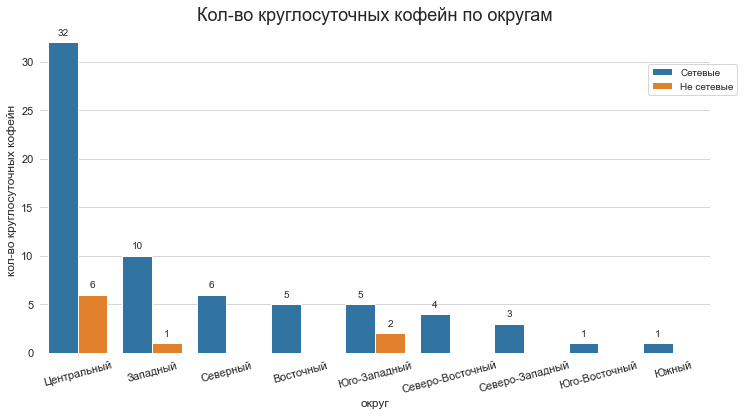

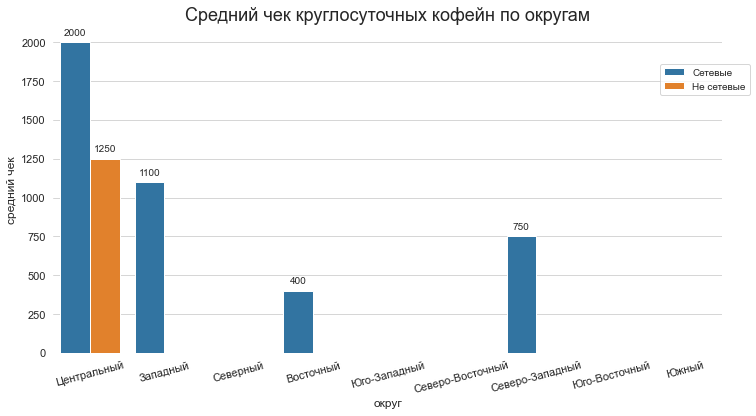

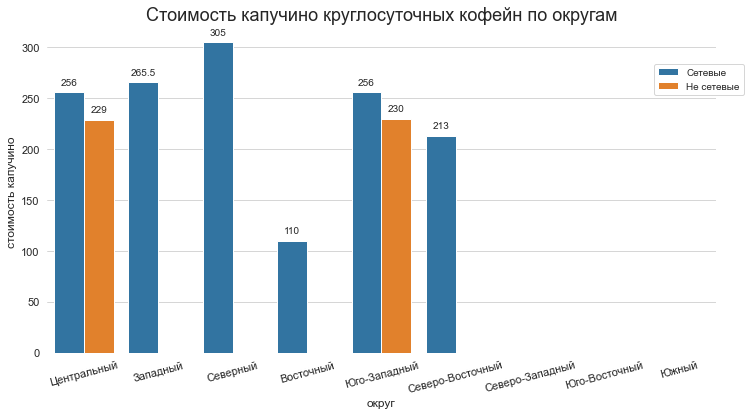

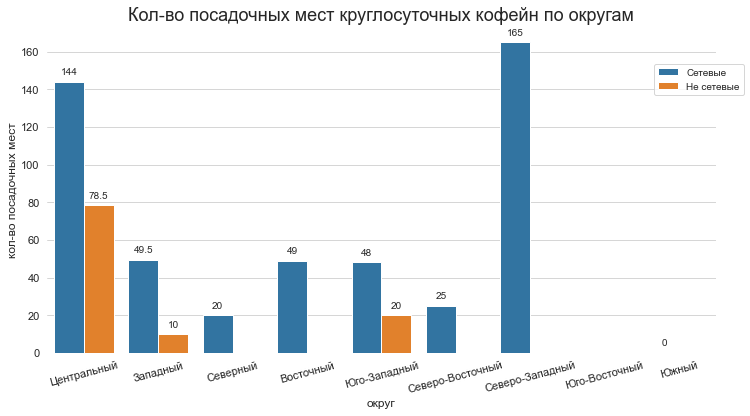

In [104]:
coffee_house_distr_24['district'] = coffee_house_distr_24['district'].map(
    lambda x: ' '.join(x.split()[:-2])
)

col_grf = ['name','middle_avg_bill','middle_coffee_cup','seats']
name_grf = [
    'Кол-во круглосуточных кофейн по округам',
    'Средний чек круглосуточных кофейн по округам',
    'Стоимость капучино круглосуточных кофейн по округам',
    'Кол-во посадочных мест круглосуточных кофейн по округам'
]
y_name=[
    'кол-во круглосуточных кофейн',
    'средний чек',
    'стоимость капучино ',
    'кол-во посадочных мест'
]

for i in range(len(col_grf)):
    # назначаем стиль графика
    sns.set_style('whitegrid')
    # назначаем размер графика
    plt.figure(figsize=(12, 6))
    plt.box(False) #убрать рамку

    # строим график
    ax = sns.barplot(
        x='district', 
        y=col_grf[i], 
        hue='chais_text',
        data=coffee_house_distr_24
    ) 

    # формируем заголовок графика и подписи осей средствами matplotlib
    plt.title(name_grf[i], size=18)
    plt.xlabel('округ', size=12)
    plt.ylabel(y_name[i], size=12)
    plt.xticks(rotation=15)
    plt.legend(bbox_to_anchor=(0.9, 0.9))
    for i in range(len(coffee_house_distr_24['chais_text'].value_counts())):
        ax.bar_label(ax.containers[i], padding=5, size=10)
    ax.tick_params(labelsize=11)

#### Кол-во круглосуточных сетевых и не сетевых кофейн по округам:

Видим что не сетевых всего 9 шт.
- в Центре 6 шт
- на Юго-Западе - 2 шт
- Западе 1 шт

Сетевых больше всего в Центре 1/2 от всех круглосуточных кофейн

#### Средний чек круглосуточных сетевых и не сетевых кофейн по округам

- Самые высокие средние чеки в Центре(сетевые - 2000р, не сетевые - 1250), Западе (сетевые - 1100)

- Самые низкие средние чеки Востоке(сетевые - 400)

*Много пропущеных ячеек так что точность выводо условна.

#### Стоимость капучино в сетевых и не сетевых круглосуточных кофейн по округам:

- Самое дорогое капучино:
    - Севере(сетевые) - 305
    - Западе(сетевые - 265) 
    - Центре (сетевые) и Юго-Западе(сетевые) - 256
    
    
- Самое доступное капучино на Востоке (сетевые - 110)

#### Кол-во посадочных мест в сетевых и не сетевых круглосуточных кофейн по округам:

Самые большые компании в любое время дня могут разместиться на:
- Северо-Западе(сетевые) 165 посадочных мест
- Центре (сетевые) 144 посадочных мест

им же стоит избегать:
- Запада(не сетевые) 10 посадочных мест
- Севера(сетевые) 20 посадочных мест
- Юго-Запада(не сетевые) 20 посадочных мест

### Выводы:

- По количеству заведений кофейни на **3 месте 17% (1413)** из них всего **5% круглосуточные(76)**.


- **30%(428)** всех кофейн находятся в **Центре**, из них круглосуточных **32 кофейни**.


- Самые **пустующий округ Северо-Запад** всего **4,4%(62)**, из них круглосуточных **3 кофейни**.


- Самый высокий средний чек **750 в Центре(сетевые), Юге(не сетевые), Востоке(сетевые) и Северо-Западе(сетевые)**
- **В круглосуточных кофейнях средний чек заметно выше от 400-2000р.**


- Цена капучино находится в диапозоне **от 109,5-222,5**, самое **дорогое на Западе**, а **доступное на Юге**.
- Диапозон в круглосуточных кофейнях доходит **до 305р.** - на Севере.


- Количество посадочных мест находится в среднем от 25 до 125.

Рекомендация:
 - Если не боятся конкуренции и соответсвовать названю «Central Perk» то лучше открывать круглосуточную кофейню в Центральном округе, так как средний чек выше особено у круглосуточных кофейн.
 
 
 - Если начинать не с Центра лучше выбрать Северо-Запад, так как тут самая низкая конкуренция при относительно высоких средних чеках как у круглосуточных так и не у круглосуточных кофейн. 
 
 
 - И запасной вариант (так как для Северо-Запада данные для сетевых кофейн) если заказчик не будет сразу отрывать сеть, можно выбрать Юг, он сильно выделяется высоким средним чеком у не сетевых кофейн, к сожалению данных по круглосуточных у нас нет, но глядя по другим районам вполне возможно они будут только выше.

## Презентация:

Презентация: https://disk.yandex.ru/i/saMgE7oGzAjGMw